#### Team Name: sso9282_sk11297_zy2891
#### Team Members: Simar Oberoi (sso9282), Soohan Kim (sk11297), Zehao Yang (zy2891) 

In [3]:
data_path = '../data/facteus_10k_user_panel.zip'

import zipfile
import pandas as pd

zipped = zipfile.ZipFile(data_path, 'r')
df = pd.read_csv(zipped.open('facteus_10k_user_panel.csv'))
df.head(10)

,account,date,merchant,merchant_string_example,merchant_ticker,merchant_exchange,transactions,spend,spend_min,spend_max
0,a04:512:000ACA1D00B403C9BD4848010BBBCB63,2018-01-01 00:00:00 UTC,AMAZON,AMAZON MKTPLACE PMTS AMZN.COM/BILLWAUSPUGLV,AMZN,NASDAQ,2,4.72,1.88,2.84
1,a04:512:000ACA1D00B403C9BD4848010BBBCB63,2018-01-01 00:00:00 UTC,DUNKIN DONUTS,DUNKIN #308696 Q35 IRVINGTON NJUS0EBSE,DNKN,NASDAQ,1,7.33,7.33,7.33
2,a04:512:000ACA1D00B403C9BD4848010BBBCB63,2018-01-01 00:00:00 UTC,EXXON MOBIL,EXXONMOBIL 99243909 NEWARK NJUS1JJWD,XOM,NYSE,1,10.02,10.02,10.02
3,a04:512:000ACA1D00B403C9BD4848010BBBCB63,2018-01-01 00:00:00 UTC,PNC BANK,PNC BANK MAPYJCUN,PNC,NYSE,3,212.44,29.74,102.36
4,a04:512:000ACA1D00B403C9BD4848010BBBCB63,2018-02-01 00:00:00 UTC,AMAZON,AMAZON MKTPLACE PMTS AMZN.COM/BILLWAUSOA5ML,AMZN,NASDAQ,3,44.04,10.17,20.94
5,a04:512:000ACA1D00B403C9BD4848010BBBCB63,2018-02-01 00:00:00 UTC,IHOP,IHOP #2055 IRVINGTON NJUSZFZBP,DIN,NYSE,1,83.83,83.83,83.83
6,a04:512:000ACA1D00B403C9BD4848010BBBCB63,2018-02-01 00:00:00 UTC,PNC BANK,PNC BANK MAPV1IIP,PNC,NYSE,6,811.70,19.66,406.45
7,a04:512:000ACA1D00B403C9BD4848010BBBCB63,2018-02-01 00:00:00 UTC,SUBWAY,SUBWAY 00561274 HILLSIDE NJUSXZHFG,NaN,NaN,1,13.75,13.75,13.75
8,a04:512:000ACA1D00B403C9BD4848010BBBCB63,2018-02-01 00:00:00 UTC,WAWA,WAWA 8350 00083501 MAPLEWOOD NJUSBHZJA,NaN,NaN,1,14.96,14.96,14.96
9,a04:512:000ACA1D00B403C9BD4848010BBBCB63,2018-03-01 00:00:00 UTC,AMAZON,AMAZON MKTPLACE PMTS AMZN.COM/BILLWAUSPCVGF,AMZN,NASDAQ,1,21.05,21.05,21.05


## 1. Regular Expressions

### (a) Isolate / find all variations of merchant strings belonging to merchant  MCDONALDS, AMAZON, APPLE

In [10]:
import re
from tqdm import tqdm

regex_merchants = []

for row in tqdm(df['merchant_string_example']):
    
    if re.search(r'\bKINDLE\b | \bAM(A)?Z(?:ONPRIME|ON|N)\b | \bPRIME\b', str(row)):
        regex_merchants.append('AMAZON')
    elif re.search(r'(AP(P)?L(E)?) | (ITUNES)', str(row)):
        regex_merchants.append('APPLE')
    elif re.search(r'(MCDONALD)', str(row)):
        regex_merchants.append('MCDONALDS')
    else:
        regex_merchants.append(None)
        
df['regex_merchants'] = regex_merchants

for i in tqdm(range(len(df))): 
    print(df.loc[i, ['merchant', 'merchant_string_example', 'regex_merchants']])
    
    if i > 10000:
        break

  0%|                                                                         | 122/4242945 [00:00<5:33:05, 212.30it/s]

merchant                                                          AMAZON
merchant_string_example    AMAZON MKTPLACE PMTS   AMZN.COM/BILLWAUSPUGLV
regex_merchants                                                     None
Name: 0, dtype: object
merchant                                                   DUNKIN DONUTS
merchant_string_example    DUNKIN #308696 Q35     IRVINGTON    NJUS0EBSE
regex_merchants                                                     None
Name: 1, dtype: object
merchant                                                     EXXON MOBIL
merchant_string_example    EXXONMOBIL    99243909 NEWARK       NJUS1JJWD
regex_merchants                                                     None
Name: 2, dtype: object
merchant                                         PNC BANK
merchant_string_example    PNC BANK              MAPYJCUN
regex_merchants                                      None
Name: 3, dtype: object
merchant                                                          AMAZON
merc

  0%|                                                                         | 239/4242945 [00:01<3:23:17, 347.82it/s]

merchant                                         PNC BANK
merchant_string_example    PNC BANK              MAPVPJH1
regex_merchants                                      None
Name: 122, dtype: object
merchant                                                          SUBWAY
merchant_string_example    SUBWAY        00586453 BRANFORD     CTUSMQPAG
regex_merchants                                                     None
Name: 123, dtype: object
merchant                                                          SUNOCO
merchant_string_example    SUNOCO 0771723400      UNION        NJUSDKR1H
regex_merchants                                                     None
Name: 124, dtype: object
merchant                                                            WAWA
merchant_string_example    WAWA 8350     00083501 MAPLEWOOD    NJUSQYPCB
regex_merchants                                                     None
Name: 125, dtype: object
merchant                                                        7-ELE

  0%|                                                                         | 416/4242945 [00:01<2:23:36, 492.38it/s]

merchant                                                       WALGREENS
merchant_string_example    WALGREENS #7460        ORLANDO      FLUSRYLXT
regex_merchants                                                     None
Name: 239, dtype: object
merchant                                                            WAWA
merchant_string_example    WAWA STORE 51600051607 ORLANDO      FLUSMT5LJ
regex_merchants                                                     None
Name: 240, dtype: object
merchant                                                        7-ELEVEN
merchant_string_example    7-ELEVEN 34780         ALTAMONTE SPRFLUS4PQBW
regex_merchants                                                     None
Name: 241, dtype: object
merchant                                                          BP GAS
merchant_string_example    BP#1743574EZ FOOD STOREDAVENPORT    FLUS32S5C
regex_merchants                                                     None
Name: 242, dtype: object
merchant                

  0%|                                                                         | 539/4242945 [00:01<2:10:15, 542.83it/s]

merchant                                                          PUBLIX
merchant_string_example    PUBLIX SUPER MAR 250 CICLERMONT     FLUSSZUYB
regex_merchants                                                     None
Name: 416, dtype: object
merchant                                                         WALMART
merchant_string_example    WM SUPERC WAL-MART SUP CLERMONT       FLN3CI5
regex_merchants                                                     None
Name: 417, dtype: object
merchant                                                            WAWA
merchant_string_example    WAWA 5205     00052050 ORLANDO      FLUSEMQQL
regex_merchants                                                     None
Name: 418, dtype: object
merchant                                                        7-ELEVEN
merchant_string_example    7-ELEVEN 35741         CLERMONT     FLUS5NVSR
regex_merchants                                                     None
Name: 419, dtype: object
merchant                


  0%|                                                                         | 597/4242945 [00:01<2:14:38, 525.13it/s]

merchant                                                           SHELL
merchant_string_example    SHELL SERVICE STATION  HAINES CITY  FLUS1RV0Q
regex_merchants                                                     None
Name: 539, dtype: object
merchant                                                          SUBWAY
merchant_string_example    SUBWAY 24116           WINTER PARK  FLUSEDL5R
regex_merchants                                                     None
Name: 540, dtype: object
merchant                                                       TACO BELL
merchant_string_example    TACO BELL 034778       DAVENPORT    FLUSQ3G33
regex_merchants                                                     None
Name: 541, dtype: object
merchant                                                   TIJUANA FLATS
merchant_string_example    TIJUANA FLATS #247     CHAMPIONS GATFLUSYF4PT
regex_merchants                                                     None
Name: 542, dtype: object
merchant                

  0%|                                                                         | 722/4242945 [00:01<2:03:58, 570.32it/s]

merchant                                                       TACO BELL
merchant_string_example    TACO BELL 032895       HILLSBORO    OHUSOQOHX
regex_merchants                                                     None
Name: 646, dtype: object
merchant                                               TIME WARNER CABLE
merchant_string_example    TWC*TIMEWARNERCABLE    513-469-1112 OHUST1WQ2
regex_merchants                                                     None
Name: 647, dtype: object
merchant                                                         WALMART
merchant_string_example    WM SUPERC WAL-MART SUP HILLSBORO      OHZGTL3
regex_merchants                                                     None
Name: 648, dtype: object
merchant                                                          AMAZON
merchant_string_example    AMAZONPRIME MEMBERSHIP AMZN.COM/PRMEWAUSFXNAG
regex_merchants                                                     None
Name: 649, dtype: object
merchant                

  0%|                                                                         | 918/4242945 [00:02<1:55:34, 611.75it/s]

merchant                                     PEOPLES BANK
merchant_string_example    PEOPLES BANK          HILSSMZK
regex_merchants                                      None
Name: 774, dtype: object
merchant                                                       PIZZA HUT
merchant_string_example    PIZZA HUT 10161        HILLSBORO    OHUSE5OIF
regex_merchants                                                     None
Name: 775, dtype: object
merchant                                                        SPEEDWAY
merchant_string_example    SPEEDWAY 05413 145     HILLSBORO    OHUSSECAX
regex_merchants                                                     None
Name: 776, dtype: object
merchant                                                         SPOTIFY
merchant_string_example    PAYPAL *SPOTIFYUSAI    402-935-7733 NYUSB3NMN
regex_merchants                                                     None
Name: 777, dtype: object
merchant                                                          SUB

  0%|                                                                        | 1060/4242945 [00:02<1:47:18, 658.82it/s]

merchant                                                        SPEEDWAY
merchant_string_example    SPEEDWAY 09352 SCO     SCOTT DEPOT  WVUSCYTH5
regex_merchants                                                     None
Name: 918, dtype: object
merchant                                                         SPOTIFY
merchant_string_example    PAYPAL *SPOTIFYUSAI    402-935-7733 NYUSVVZPT
regex_merchants                                                     None
Name: 919, dtype: object
merchant                                                       TACO BELL
merchant_string_example    TACO BELL 032895       HILLSBORO    OHUSYSKS4
regex_merchants                                                     None
Name: 920, dtype: object
merchant                                               TIME WARNER CABLE
merchant_string_example    TWC*TIMEWARNERCABLE    513-469-1112 OHUSX1PRD
regex_merchants                                                     None
Name: 921, dtype: object
merchant                

  0%|                                                                        | 1192/4242945 [00:02<1:55:23, 612.67it/s]

merchant                                                          AFFIRM
merchant_string_example    AFFIRM *PAYMENT        855-423-3729 CAUSMCQX2
regex_merchants                                                     None
Name: 1077, dtype: object
merchant                                                          AMAZON
merchant_string_example    PRIME VIDEO*7D69N5193  888-802-3080 WAUSAKH2O
regex_merchants                                                     None
Name: 1078, dtype: object
merchant                                                          BP GAS
merchant_string_example    BP#89329151245 WLMNGTN WILMINGTON   OHUSKJTCA
regex_merchants                                                     None
Name: 1079, dtype: object
merchant                                              BUFFALO WILD WINGS
merchant_string_example    BUFFALO WILD WINGS     WILMINGTON   OHUSJXIDB
regex_merchants                                                     None
Name: 1080, dtype: object
merchant            

  0%|                                                                        | 1325/4242945 [00:02<1:51:15, 635.37it/s]

merchant                                                          AFFIRM
merchant_string_example    AFFIRM.COM PAYMENTS    AFFIRM.COM   CAUSFGT0J
regex_merchants                                                     None
Name: 1202, dtype: object
merchant                                                          AMAZON
merchant_string_example    PRIME VIDEO*MU67V3LF1  888-802-3080 WAUSR0HAR
regex_merchants                                                     None
Name: 1203, dtype: object
merchant                                                           ARBYS
merchant_string_example    ARBY'S #5661           WILMINGTON   OHUSTG43S
regex_merchants                                                     None
Name: 1204, dtype: object
merchant                                          BLIZZARD ENTERTAINMENT
merchant_string_example    PAYPAL *BLIZZARDENT    402-935-7733 CAUSOWLAP
regex_merchants                                                     None
Name: 1205, dtype: object
merchant            

  0%|                                                                        | 1453/4242945 [00:03<2:00:38, 585.95it/s]

merchant                                                     RACEWAY GAS
merchant_string_example    RACEWAY 6917           RIVERDALE    GAUSQVGL1
regex_merchants                                                     None
Name: 1367, dtype: object
merchant                                                   RAINBOW SHOPS
merchant_string_example    RAINBOW #1581 1532 SOUTMORROW       GAUSZJ3N0
regex_merchants                                                     None
Name: 1368, dtype: object
merchant                                                           RUE21
merchant_string_example    RUE21 1426 CUMBERLAND MATLANTA      GAUSC5PZ3
regex_merchants                                                     None
Name: 1369, dtype: object
merchant                                                          SBARRO
merchant_string_example    SQ *SBARRO SOUTHLAKE MAMORROW       GAUSSOTVA
regex_merchants                                                     None
Name: 1370, dtype: object
merchant            

  0%|                                                                        | 1570/4242945 [00:03<2:07:36, 553.97it/s]

merchant                                                CRICKET WIRELESS
merchant_string_example    CRICKET WIRELESS       855-246-2461 FLUSN1HW2
regex_merchants                                                     None
Name: 1490, dtype: object
merchant                                                     DOLLAR TREE
merchant_string_example    DOLLAR TR 4919 FLAT SH DECATUR        GAU4W5P
regex_merchants                                                     None
Name: 1491, dtype: object
merchant                                                   FAMILY DOLLAR
merchant_string_example    FAMILY DOLLAR #        FAIRBURN       GAUTFCI
regex_merchants                                                     None
Name: 1492, dtype: object
merchant                                                             KFC
merchant_string_example    KFC G135115            UNION CITY   GAUSJDGQ0
regex_merchants                                                     None
Name: 1493, dtype: object
merchant            

  0%|                                                                        | 1680/4242945 [00:03<2:17:45, 513.15it/s]

merchant                                                           APPLE
merchant_string_example    APPLE.COM/BILL         866-712-7753 CAUSRVPN4
regex_merchants                                                     None
Name: 1619, dtype: object
merchant                                                             ATT
merchant_string_example    ATT*BILL PAYMENT       800-288-2020 TXUS0K1I0
regex_merchants                                                     None
Name: 1620, dtype: object
merchant                             BOJANGLES FAMOUS CHICKEN N BISCUITS
merchant_string_example    BOJANGLES 1254         LITHONIA     GAUSACHDU
regex_merchants                                                     None
Name: 1621, dtype: object
merchant                                                         CHEVRON
merchant_string_example    CHEVRON 0354014        FAIRBURN     GAUSYR330
regex_merchants                                                     None
Name: 1622, dtype: object
merchant            

  0%|                                                                        | 1848/4242945 [00:03<2:09:51, 544.32it/s]

merchant                                                          BP GAS
merchant_string_example    BP#6711956GIANT        ORANGE PARK    FLT32N1
regex_merchants                                                     None
Name: 1733, dtype: object
merchant                                                         CHEVRON
merchant_string_example    CHEVRON 0212467        JACKSONVILLE FLUSQ4L1H
regex_merchants                                                     None
Name: 1734, dtype: object
merchant                                                        CHIPOTLE
merchant_string_example    CHIPOTLE 0995          JACKSONVILLE FLUS302OP
regex_merchants                                                     None
Name: 1735, dtype: object
merchant                                                        CIRCLE K
merchant_string_example    CIRCLE K # 26299       JACKSONVILLE FLUSTOSGC
regex_merchants                                                     None
Name: 1736, dtype: object
merchant            

  0%|                                                                        | 1956/4242945 [00:04<2:17:20, 514.67it/s]

merchant                                                           APPLE
merchant_string_example    APPLE.COM/BILL         866-712-7753 CAUSPUV2B
regex_merchants                                                     None
Name: 1848, dtype: object
merchant                                                          BP GAS
merchant_string_example    BP#6710735GIANT        JACKSONVILLE   FLQOFNM
regex_merchants                                                     None
Name: 1849, dtype: object
merchant                                          CHARLEYS PHILLY STEAKS
merchant_string_example    CHARLEYS PHILLY STEAKS JACKSONVILLE FLUSX4KGG
regex_merchants                                                     None
Name: 1850, dtype: object
merchant                                                     DOLLAR TREE
merchant_string_example    DOLLAR TR 11250 OLD SA JACKSONVILLE   FLRRFTK
regex_merchants                                                     None
Name: 1851, dtype: object
merchant            

  0%|                                                                        | 2070/4242945 [00:04<2:09:52, 544.26it/s]

merchant                                                     WHATABURGER
merchant_string_example    WHATABURGER ONLINE     HTTPSWHATABURTXUSR0XB3
regex_merchants                                                     None
Name: 1956, dtype: object
merchant                                                          ZAXBYS
merchant_string_example    ZAXBY'S #70501         JACKSONVILLE FLUSAB4KJ
regex_merchants                                                     None
Name: 1957, dtype: object
merchant                                               AMERICAN AIRLINES
merchant_string_example    AMERICAN AIR00121445062FORT WORTH   TXUSHLYML
regex_merchants                                                     None
Name: 1958, dtype: object
merchant                                                           APPLE
merchant_string_example    APPLE.COM/BILL         866-712-7753 CAUSZNEEF
regex_merchants                                                     None
Name: 1959, dtype: object
merchant            


  0%|                                                                        | 2133/4242945 [00:04<2:04:17, 568.67it/s]

merchant                                                         DIRECTV
merchant_string_example    DIRECTV*NOW            800-965-7288 TXUSD32F2
regex_merchants                                                     None
Name: 2101, dtype: object
merchant                                                  DOLLAR GENERAL
merchant_string_example    DOLLAR-GE 7110 E SHELB MEMPHIS        TNRCSBK
regex_merchants                                                     None
Name: 2102, dtype: object
merchant                                                        GOODWILL
merchant_string_example    GOODWILL STAGE ROA     MEMPHIS      TNUSNTEKX
regex_merchants                                                     None
Name: 2103, dtype: object
merchant                                                            IHOP
merchant_string_example    IHOP #4404             MEMPHIS      TNUSJKYIL
regex_merchants                                                     None
Name: 2104, dtype: object
merchant            

  0%|                                                                        | 2244/4242945 [00:04<2:35:13, 455.35it/s]

merchant                                                          SUBWAY
merchant_string_example    SUBWAY        00017228 MEMPHIS      TNUSL4NJX
regex_merchants                                                     None
Name: 2186, dtype: object
merchant                                                       TACO BELL
merchant_string_example    TACO BELL #035148      MEMPHIS      TNUSER2AT
regex_merchants                                                     None
Name: 2187, dtype: object
merchant                                                       WALGREENS
merchant_string_example    WALGREENS STORE 3489 RAMEMPHIS      TNUSXDHER
regex_merchants                                                     None
Name: 2188, dtype: object
merchant                                                          BP GAS
merchant_string_example    BP#8424475MACS STORE 36MEMPHIS      TNUSF1C0J
regex_merchants                                                     None
Name: 2189, dtype: object
merchant            

  0%|                                                                        | 2338/4242945 [00:04<2:43:20, 432.70it/s]

merchant                                       POPEYES LOUISIANA KITCHEN
merchant_string_example    DOORDASH*POPEYES LOUIS WWW.DOORDASH.CAUSIGURZ
regex_merchants                                                     None
Name: 2281, dtype: object
merchant                                                           SHELL
merchant_string_example    SHELL SERVICE S        MEMPHIS        TNDNI0X
regex_merchants                                                     None
Name: 2282, dtype: object
merchant                                                       TACO BELL
merchant_string_example    TACO BELL #035148      MEMPHIS      TNUSVNVU3
regex_merchants                                                     None
Name: 2283, dtype: object
merchant                                                         WALMART
merchant_string_example    WM SUPERC WAL-MART SUP MEMPHIS        TNUDFM0
regex_merchants                                                     None
Name: 2284, dtype: object
merchant            

  0%|                                                                        | 2485/4242945 [00:05<2:31:01, 467.96it/s]

merchant                                                          WENDYS
merchant_string_example    WENDY'S 226            LEXINGTON    SCUSUWCCT
regex_merchants                                                     None
Name: 2384, dtype: object
merchant                                  WHICH WICH SUPERIOR SANDWICHES
merchant_string_example    WHICH WICH #339        SUMMERVILLE  SCUS2WPJH
regex_merchants                                                     None
Name: 2385, dtype: object
merchant                                                          ZAXBYS
merchant_string_example    LEVELUP*ZAXBYS95897576 855-466-5585 MAUSA42MO
regex_merchants                                                     None
Name: 2386, dtype: object
merchant                                                           APPLE
merchant_string_example    APL*ITUNES.COM/BILL    866-712-7753 CAUSAVV15
regex_merchants                                                     None
Name: 2387, dtype: object
merchant            

  0%|                                                                        | 2581/4242945 [00:05<2:34:29, 457.46it/s]

merchant                                                       MCDONALDS
merchant_string_example    MCDONALD'S F19591      FLORENCE     SCUSSLHBO
regex_merchants                                                MCDONALDS
Name: 2532, dtype: object
merchant                                                         NETFLIX
merchant_string_example    NETFLIX.COM            NETFLIX.COM  CAUSXZCUU
regex_merchants                                                     None
Name: 2533, dtype: object
merchant                               RED ROBIN GOURMET BURGERS & BREWS
merchant_string_example    RED ROBIN NO 577       COLUMBIA     SCUS1V12O
regex_merchants                                                     None
Name: 2534, dtype: object
merchant                                                           SHELL
merchant_string_example    SHELL SERVICE S        ORANGEBURG     SCZDGQU
regex_merchants                                                     None
Name: 2535, dtype: object
merchant            

  0%|                                                                        | 2728/4242945 [00:05<2:29:04, 474.08it/s]

merchant                                             USA CANTEEN VENDING
merchant_string_example    USA*CANTEEN            COLUMBIA     SCUSDQZR4
regex_merchants                                                     None
Name: 2628, dtype: object
merchant                                                       WALGREENS
merchant_string_example    WALGREENS STORE 6500 GACOLUMBIA     SCUSC2HYG
regex_merchants                                                     None
Name: 2629, dtype: object
merchant                                                          WENDYS
merchant_string_example    WENDYS #0057           LEXINGTON    SCUSTP2BB
regex_merchants                                                     None
Name: 2630, dtype: object
merchant                                                           BI-LO
merchant_string_example    BI-LO GRO 1370 CHESTNU ORANGEBURG     SCEQ5PF
regex_merchants                                                     None
Name: 2631, dtype: object
merchant            

  0%|                                                                        | 2836/4242945 [00:05<2:20:42, 502.25it/s]

merchant                                                     HOLIDAY INN
merchant_string_example    HOLIDAY INN EXPRESS & SNEWBERRY     SCUSVW2AB
regex_merchants                                                     None
Name: 2740, dtype: object
merchant                                             LOVES COUNTRY STORE
merchant_string_example    LOVES COUNTRY 00003962 NEWBERRY     SCUSH3VU5
regex_merchants                                                     None
Name: 2741, dtype: object
merchant                                                           PILOT
merchant_string_example    PILOT #0338            CAYCE        SCUSFDJN0
regex_merchants                                                     None
Name: 2742, dtype: object
merchant                                                           SHELL
merchant_string_example    SHELL SERVICE STATION  ORANGEBURG   SCUSWICRN
regex_merchants                                                     None
Name: 2743, dtype: object
merchant            

  0%|                                                                        | 2937/4242945 [00:06<2:30:16, 470.24it/s]

merchant                                                     TRADER JOES
merchant_string_example    TRADER JOE'S #676  QPS WOODMERE     OHUSW4TBQ
regex_merchants                                                     None
Name: 2846, dtype: object
merchant                                        U.S. BANK
merchant_string_example    U.S. BANK             WARZZ4WT
regex_merchants                                      None
Name: 2847, dtype: object
merchant                                                       WALGREENS
merchant_string_example    WALGREENS #4775        TWINSBURG    OHUS3Z4KN
regex_merchants                                                     None
Name: 2848, dtype: object
merchant                                                         WALMART
merchant_string_example    WAL-MART SUPER CENTER  MACEDONIA      OHWNJJ3
regex_merchants                                                     None
Name: 2849, dtype: object
merchant                                                         

  0%|                                                                        | 3037/4242945 [00:06<2:30:42, 468.90it/s]

merchant                                                        CIRCLE K
merchant_string_example    CIRCLE K 05621         MAPLE HEIGHTSOHUSYOQ1C
regex_merchants                                                    APPLE
Name: 2940, dtype: object
merchant                                                GABRIEL BROTHERS
merchant_string_example    GABRIEL BROS - 0079    AURORA       OHUSPBB31
regex_merchants                                                     None
Name: 2941, dtype: object
merchant                                            GET GO CAFE + MARKET
merchant_string_example    GET GO #3201           BEDFORD      OHUST2UBU
regex_merchants                                                     None
Name: 2942, dtype: object
merchant                                             GTL GLOBAL TEL LINK
merchant_string_example    GTL*INMATE PHONE SVC   877-650-4249 VAUSYTH51
regex_merchants                                                     None
Name: 2943, dtype: object
merchant            

  0%|                                                                        | 3140/4242945 [00:06<2:26:18, 482.97it/s]

merchant                                                   FAMILY DOLLAR
merchant_string_example    FAMILY DOLLAR #4321    CLEVELAND    OHUSTYMNU
regex_merchants                                                     None
Name: 3055, dtype: object
merchant                                                     FIRST WATCH
merchant_string_example    0105 FIRST WATCH RESTAUSOLON        OHUSK3UNS
regex_merchants                                                     None
Name: 3056, dtype: object
merchant                                                     GIANT EAGLE
merchant_string_example    GIANT-EAGLE #0224      TWINSBURG    OHUSBI2DU
regex_merchants                                                     None
Name: 3057, dtype: object
merchant                                              MARATHON PETROLEUM
merchant_string_example    MARATHON PETRO132217   HIGHLAND HEIGOHUS32CCS
regex_merchants                                                     None
Name: 3058, dtype: object
merchant            

  0%|                                                                        | 3241/4242945 [00:06<2:23:38, 491.92it/s]

merchant                                                             CVS
merchant_string_example    CVS/PHARMACY #04347    GARFIELD HEIGOHUSVOPYK
regex_merchants                                                     None
Name: 3181, dtype: object
merchant                                                     DAIRY QUEEN
merchant_string_example    DAIRY QUEEN #17846     LAKEWOOD     OHUSHRXL3
regex_merchants                                                     None
Name: 3182, dtype: object
merchant                                                     DOLLAR TREE
merchant_string_example    DOLLAR TREE            CLEVELAND    OHUSPCYM2
regex_merchants                                                     None
Name: 3183, dtype: object
merchant                                                   DUNKIN DONUTS
merchant_string_example    DUNKIN #351269         GARFIELD HEIGOHUSP0SJB
regex_merchants                                                     None
Name: 3184, dtype: object
merchant            

  0%|                                                                        | 3393/4242945 [00:07<2:27:58, 477.52it/s]

merchant                                                  DOLLAR GENERAL
merchant_string_example    DOLLAR GENERAL #21390  GARFIELD HEIGOHUSU2NOY
regex_merchants                                                     None
Name: 3293, dtype: object
merchant                                                            HULU
merchant_string_example    HLU*HULU 1490295537911-HULU.COM/BILLCAUSLT0JX
regex_merchants                                                     None
Name: 3294, dtype: object
merchant                                                            IPSY
merchant_string_example    IPSY GLAM BAG          HELP.IPSY.COMCAUSZT4V1
regex_merchants                                                     None
Name: 3295, dtype: object
merchant                                                         NETFLIX
merchant_string_example    NETFLIX.COM            NETFLIX.COM  CAUS1TLG3
regex_merchants                                                     None
Name: 3296, dtype: object
merchant            

  0%|                                                                        | 3488/4242945 [00:07<2:31:45, 465.58it/s]

merchant                                                     CHICK-FIL-A
merchant_string_example    CHICK-FIL-A #03253     TULSA        OKUSNMRBQ
regex_merchants                                                     None
Name: 3393, dtype: object
merchant                                                           CHUYS
merchant_string_example    CHUY S TULSA           TULSA        OKUSKWZIG
regex_merchants                                                     None
Name: 3394, dtype: object
merchant                                                CRICKET WIRELESS
merchant_string_example    CRICKET WIRELESS       855-246-2461 FLUSE0W41
regex_merchants                                                     None
Name: 3395, dtype: object
merchant                                                         DOMINOS
merchant_string_example    DOMINO'S 6490          580-583-9210 OKUSNTEQD
regex_merchants                                                     None
Name: 3396, dtype: object
merchant            

  0%|                                                                        | 3612/4242945 [00:07<2:10:19, 542.14it/s]

merchant                                                CRICKET WIRELESS
merchant_string_example    CRICKET WIRELESS       855-246-2461 FLUS030UG
regex_merchants                                                     None
Name: 3536, dtype: object
merchant                                                      HOME DEPOT
merchant_string_example    THE HOME DEPOT #3913   TULSA        OKUST0VXD
regex_merchants                                                     None
Name: 3537, dtype: object
merchant                                                 JACK IN THE BOX
merchant_string_example    JACK IN THE BOX 6139   BROKEN ARROW OKUSQAXMZ
regex_merchants                                                     None
Name: 3538, dtype: object
merchant                                                  LITTLE CAESARS
merchant_string_example    LITTLE CAESARS 3222-000TULSA        OKUSGJFHV
regex_merchants                                                     None
Name: 3539, dtype: object
merchant            

  0%|                                                                        | 3805/4242945 [00:07<1:55:49, 609.96it/s]

merchant                                                            ALDI
merchant_string_example    ALDI 46017             TUSLA          OKTRDF0
regex_merchants                                                     None
Name: 3668, dtype: object
merchant                                                    AMC THEATRES
merchant_string_example    9640 AMC ONLINE        888-440-4262 KSUS0OTPL
regex_merchants                                                     None
Name: 3669, dtype: object
merchant                                                           ARBYS
merchant_string_example    ARBY'S 5001015         BROKEN ARROW OKUSOCH2S
regex_merchants                                                     None
Name: 3670, dtype: object
merchant                                                        CARLS JR
merchant_string_example    CARLS JR 1672          TULSA        OKUSEUNKB
regex_merchants                                                     None
Name: 3671, dtype: object
merchant            

  0%|                                                                        | 3944/4242945 [00:07<1:47:49, 655.21it/s]

merchant                                                       SAMS CLUB
merchant_string_example    SAMSCLUB #6342         TULSA          OKFAT1N
regex_merchants                                                     None
Name: 3805, dtype: object
merchant                                                  SONIC DRIVE-IN
merchant_string_example    SONIC #2854            SAPULPA      OKUSY1HQ1
regex_merchants                                                     None
Name: 3806, dtype: object
merchant                                                          TARGET
merchant_string_example    TARGET T- 10711 E 71ST TULSA          OKFSFLK
regex_merchants                                                     None
Name: 3807, dtype: object
merchant                                                       UBER EATS
merchant_string_example    UBER   EATS            HELP.UBER.COMCAUSXXU3Q
regex_merchants                                                     None
Name: 3808, dtype: object
merchant            

  0%|                                                                        | 4081/4242945 [00:08<1:48:16, 652.46it/s]

merchant                                                        ETSY.COM
merchant_string_example    ETSY.COM               718-8557955  NYUSET5E0
regex_merchants                                                     None
Name: 3984, dtype: object
merchant                                                             GNC
merchant_string_example    GNC #001695            TULSA        OKUSLWOCC
regex_merchants                                                     None
Name: 3985, dtype: object
merchant                                                            HULU
merchant_string_example    HLU*HULU 656015101924-UHULU.COM/BILLCAUSQJ0MT
regex_merchants                                                     None
Name: 3986, dtype: object
merchant                                                       MCDONALDS
merchant_string_example    MCDONALD'S M5264 OF OK TULSA        OKUSWNNID
regex_merchants                                                MCDONALDS
Name: 3987, dtype: object
merchant            

  0%|                                                                        | 4284/4242945 [00:08<2:00:45, 584.97it/s]

merchant                                                   GOLDEN CORRAL
merchant_string_example    GOLDEN CORRAL 749      GLEN ALLEN   VAUSAR30H
regex_merchants                                                     None
Name: 4153, dtype: object
merchant                                                   MAPCO EXPRESS
merchant_string_example    MAPCO EXP#4061 801 ENGLASHLAND      VAUSMWHMF
regex_merchants                                                     None
Name: 4154, dtype: object
merchant                                          STRAIGHT TALK WIRELESS
merchant_string_example    STRAIGHTTALK*AIRTIME   877-430-2355 FLUSTF1PE
regex_merchants                                                     None
Name: 4155, dtype: object
merchant                                         7-ELEVEN
merchant_string_example    7ELEVEN-FCTI          DOSZ23EM
regex_merchants                                      None
Name: 4156, dtype: object
merchant                                                  BASS PR

  0%|                                                                        | 4418/4242945 [00:08<1:54:44, 615.70it/s]

merchant                                                  DOLLAR GENERAL
merchant_string_example    DOLLAR-GE 427 ENGLAND  ASHLAND        VALS325
regex_merchants                                                     None
Name: 4284, dtype: object
merchant                                                   FAMILY DOLLAR
merchant_string_example    FAMILY DOLLAR #        BOWLING GRN    VARLG2Z
regex_merchants                                                     None
Name: 4285, dtype: object
merchant                                                        FAS MART
merchant_string_example    FAS MART 19            FREDERICKSBURVAUSD2AW0
regex_merchants                                                     None
Name: 4286, dtype: object
merchant                                                       FOOD LION
merchant_string_example    FOOD LION #1087        BOWLING GREENVAUSUWM3D
regex_merchants                                                     None
Name: 4287, dtype: object
merchant            

  0%|                                                                        | 4554/4242945 [00:08<1:54:54, 614.74it/s]

merchant                                                        7-ELEVEN
merchant_string_example    7-ELEVEN               DOSWELL        VA2UBRD
regex_merchants                                                     None
Name: 4456, dtype: object
merchant                                                     BURGER KING
merchant_string_example    BURGER KING #7923      DOSWELL      VAUSDH3TZ
regex_merchants                                                     None
Name: 4457, dtype: object
merchant                                                  DOLLAR GENERAL
merchant_string_example    DOLLAR-GENERAL #0483   BOWLING GREENVAUSUGZFK
regex_merchants                                                     None
Name: 4458, dtype: object
merchant                                                   FAMILY DOLLAR
merchant_string_example    FAMILY DOLLAR #        BOWLING GRN    VAOURTE
regex_merchants                                                     None
Name: 4459, dtype: object
merchant            

  0%|                                                                        | 4697/4242945 [00:09<1:47:06, 659.52it/s]

merchant                                                   FAMILY DOLLAR
merchant_string_example    FAMILY DOLLAR #        CHICAGO        ILZS0AK
regex_merchants                                                     None
Name: 4599, dtype: object
merchant                                                      FIVE BELOW
merchant_string_example    FIVE BELOW 714         CHICAGO      ILUSZUAQS
regex_merchants                                                     None
Name: 4600, dtype: object
merchant                                                        GAMESTOP
merchant_string_example    GAMESTOP #6164 2861 N MCHICAGO      ILUSPDWYI
regex_merchants                                                     None
Name: 4601, dtype: object
merchant                                                       MCDONALDS
merchant_string_example    MCDONALD'S F6771       CHICAGO      ILUSNIT1J
regex_merchants                                                MCDONALDS
Name: 4602, dtype: object
merchant            

  0%|                                                                        | 4852/4242945 [00:09<1:38:26, 717.53it/s]

merchant                                  PLAYSTATION SONY ENTERTAINMENT
merchant_string_example    PLAYSTATIONNETWORK     800-3457669  CAUSO3T4H
regex_merchants                                                     None
Name: 4762, dtype: object
merchant                                                   PRET A MANGER
merchant_string_example    PRET A MANGER 085      CHICAGO      ILUSHEB5R
regex_merchants                                                     None
Name: 4763, dtype: object
merchant                   SQUARE
merchant_string_example       NaN
regex_merchants              None
Name: 4764, dtype: object
merchant                                                        T-MOBILE
merchant_string_example    TMOBILE*POSTPAID FDP   800-937-8997 WAUSWOBTJ
regex_merchants                                                     None
Name: 4765, dtype: object
merchant                                        U.S. BANK
merchant_string_example    U.S. BANK             CHIUBLKL
regex_merchants      

  0%|                                                                        | 4993/4242945 [00:09<2:04:10, 568.78it/s]

merchant                            7-ELEVEN
merchant_string_example    7ELEVEN-FCTIQ34P5
regex_merchants                         None
Name: 4914, dtype: object
merchant                   APPLE PAY
merchant_string_example          NaN
regex_merchants                 None
Name: 4915, dtype: object
merchant                                                            LYFT
merchant_string_example    LYFT   *RIDE WED 9PM   LYFT.COM     CAUSXZCBG
regex_merchants                                                     None
Name: 4916, dtype: object
merchant                                                       MCDONALDS
merchant_string_example    MCDONALD'S F6676       CHICAGO      ILUSFGRD1
regex_merchants                                                MCDONALDS
Name: 4917, dtype: object
merchant                                                   PANDA EXPRESS
merchant_string_example    PANDA EXPRESS #2522    CHICAGO      ILUS3PCEH
regex_merchants                                                   

  0%|                                                                        | 5108/4242945 [00:09<2:16:49, 516.23it/s]

merchant                                                       UBER EATS
merchant_string_example    UBER   EATS            HELP.UBER.COMCAUSWCI2R
regex_merchants                                                     None
Name: 5026, dtype: object
merchant                                                          AMAZON
merchant_string_example    AMZN MKTP US*MY1X61S92 AMZN.COM/BILLWAUSY2ESG
regex_merchants                                                     None
Name: 5027, dtype: object
merchant                                                           APPLE
merchant_string_example    APPLE.COM/BILL         866-712-7753 CAUSYNGP4
regex_merchants                                                     None
Name: 5028, dtype: object
merchant                   APPLE PAY
merchant_string_example          NaN
regex_merchants                 None
Name: 5029, dtype: object
merchant                                                       MCDONALDS
merchant_string_example    DOORDASH*MCDONALDS     WWW.D

  0%|                                                                        | 5220/4242945 [00:10<2:12:05, 534.70it/s]

merchant                                                          AMAZON
merchant_string_example    AMAZON PRIME           AMZN.COM/BILLWAUSNEY0F
regex_merchants                                                   AMAZON
Name: 5143, dtype: object
merchant                                                         NETFLIX
merchant_string_example    NETFLIX.COM            NETFLIX.COM  CAUSX054Z
regex_merchants                                                     None
Name: 5144, dtype: object
merchant                                                        PETSMART
merchant_string_example    PETSMART # 1058        DENTON       TXUS4N0LG
regex_merchants                                                     None
Name: 5145, dtype: object
merchant                                                       STARBUCKS
merchant_string_example    STARBUCKS STORE 6698   HICKORY CREEKTXUSRH44N
regex_merchants                                                     None
Name: 5146, dtype: object
merchant            

  0%|                                                                        | 5391/4242945 [00:10<2:07:40, 553.19it/s]

merchant                                                         CHEVRON
merchant_string_example    CHEVRON 0356051        BUFFALO      TXUSLFVNC
regex_merchants                                                     None
Name: 5275, dtype: object
merchant                                                     CHICK-FIL-A
merchant_string_example    CHICK-FIL-A #01919     DENTON       TXUSB11EY
regex_merchants                                                     None
Name: 5276, dtype: object
merchant                                               CINEMARK THEATRES
merchant_string_example    CNK*CINEMARK.COM 216   800-246-3627 TXUS3PNXX
regex_merchants                                                     None
Name: 5277, dtype: object
merchant                                                            HULU
merchant_string_example    HLU*HULU 328470386187-UHULU.COM/BILLCAUS0VBSC
regex_merchants                                                     None
Name: 5278, dtype: object
merchant            

  0%|                                                                        | 5560/4242945 [00:10<2:07:23, 554.36it/s]

merchant                                                 CHUCK E. CHEESE
merchant_string_example    CHUCK E CHEESE DEPOSIT DALLAS       TXUSEPQJT
regex_merchants                                                     None
Name: 5391, dtype: object
merchant                                              COX COMMUNICATIONS
merchant_string_example    COX ROANOKE COMM SERV  800-234-3993 VAUSTNKE5
regex_merchants                                                     None
Name: 5392, dtype: object
merchant                                                     EXXON MOBIL
merchant_string_example    EXXONMOBIL    47594031 ROANOKE      VAUSCTPIX
regex_merchants                                                     None
Name: 5393, dtype: object
merchant                                       JO-ANN FABRICS AND CRAFTS
merchant_string_example    JOANN STORES #2185     ROANOKE      VAUSZFH1C
regex_merchants                                                     None
Name: 5394, dtype: object
merchant            

  0%|                                                                        | 5686/4242945 [00:10<2:01:01, 583.52it/s]

merchant                                                       STARBUCKS
merchant_string_example    STARBUCKS STORE 11152  ROANOKE      VAUSJHCWW
regex_merchants                                                     None
Name: 5560, dtype: object
merchant                                                       TACO BELL
merchant_string_example    TACO BELL 034841       ROANOKE      VAUSZTMB4
regex_merchants                                                     None
Name: 5561, dtype: object
merchant                                                 TUESDAY MORNING
merchant_string_example    TUESDAY MORNING # 1149 ROANOKE      VAUSYC5MN
regex_merchants                                                     None
Name: 5562, dtype: object
merchant                                                          WENDYS
merchant_string_example    WENDY'S #4008          ROANOKE      VAUS2YSUW
regex_merchants                                                     None
Name: 5563, dtype: object
merchant            

  0%|                                                                        | 5805/4242945 [00:11<2:03:02, 573.96it/s]

merchant                                                      MURPHY USA
merchant_string_example    MURPHY5528ATWAL        ROANOKE        VACENDH
regex_merchants                                                     None
Name: 5727, dtype: object
merchant                                                      PAPA JOHNS
merchant_string_example    PAPA JOHN'S #0571      ROANOKE      VAUS5ES1D
regex_merchants                                                     None
Name: 5728, dtype: object
merchant                                                         PATREON
merchant_string_example    CKO*PATREON* MEMBERSHIP833-9728766  CAUSQ31O1
regex_merchants                                                     None
Name: 5729, dtype: object
merchant                                       POPEYES LOUISIANA KITCHEN
merchant_string_example    POPEYES 12196          ROANOKE      VAUSWA2QO
regex_merchants                                                     None
Name: 5730, dtype: object
merchant            

  0%|                                                                        | 5918/4242945 [00:11<2:21:14, 499.95it/s]

merchant                                                        CIRCLE K
merchant_string_example    CIRCLE K 270603        KENNEWICK      WAVI51G
regex_merchants                                                     None
Name: 5859, dtype: object
merchant                                                  CRAIGSLIST.ORG
merchant_string_example    CRAIGSLIST.ORG         415-399-5200 CAUSL203K
regex_merchants                                                     None
Name: 5860, dtype: object
merchant                                                           FEDEX
merchant_string_example    FEDEXOFFICE   00006437 KENNEWICK    WAUSUFFB2
regex_merchants                                                     None
Name: 5861, dtype: object
merchant                                                     GODADDY.COM
merchant_string_example    DNH*GODADDY.COM        480-5058855  AZUSHQZY3
regex_merchants                                                     None
Name: 5862, dtype: object
merchant            

  0%|                                                                        | 6019/4242945 [00:11<2:24:42, 487.96it/s]

merchant                                             LOVES COUNTRY STORE
merchant_string_example    LOVE S COUNTRY00003723 ONTARIO      ORUS1OAH3
regex_merchants                                                     None
Name: 5954, dtype: object
merchant                                                       MCDONALDS
merchant_string_example    MCDONALD'S F5171       LA GRANDE    ORUSFIYZU
regex_merchants                                                MCDONALDS
Name: 5955, dtype: object
merchant                                                       MICROSOFT
merchant_string_example    MICROSOFT *OFFICE 365  MSBILL.INFO  WAUSKQPN4
regex_merchants                                                     None
Name: 5956, dtype: object
merchant                                                         NETFLIX
merchant_string_example    NETFLIX.COM            NETFLIX.COM  CAUS5YC5X
regex_merchants                                                     None
Name: 5957, dtype: object
merchant            

  0%|                                                                        | 6181/4242945 [00:11<2:16:54, 515.76it/s]

merchant                                                       MICROSOFT
merchant_string_example    MICROSOFT*STORE        MSBILL.INFO  WAUSW4ROA
regex_merchants                                                     None
Name: 6072, dtype: object
merchant                                                         NETFLIX
merchant_string_example    NETFLIX.COM            NETFLIX.COM  CAUS11TTF
regex_merchants                                                     None
Name: 6073, dtype: object
merchant                                                        NINTENDO
merchant_string_example    NINTENDO    *AMERICAUS 800-255-3700 WAUSR2HMT
regex_merchants                                                     None
Name: 6074, dtype: object
merchant                                                    OFFICE DEPOT
merchant_string_example    OFFICE DEPOT 00 6815 WEKENNEWICK    WAUSIPQB5
regex_merchants                                                     None
Name: 6075, dtype: object
merchant            


  0%|                                                                        | 6233/4242945 [00:12<2:18:51, 508.53it/s]

merchant                                                       MARSHALLS
merchant_string_example    MARSHALLS 2921 QUEENSG RICHLAND       WAT3NVM
regex_merchants                                                     None
Name: 6181, dtype: object
merchant                                                       MICROSOFT
merchant_string_example    MICROSOFT*OFFICE 365 HOMSBILL.INFO  WAUSRO0IW
regex_merchants                                                     None
Name: 6182, dtype: object
merchant                                                         NETFLIX
merchant_string_example    NETFLIX.COM            NETFLIX.COM  CAUSETN1W
regex_merchants                                                     None
Name: 6183, dtype: object
merchant                                                  PLANET FITNESS
merchant_string_example    ABC*PLANET FITNESS     509-5790595  WAUS2VOFO
regex_merchants                                                     None
Name: 6184, dtype: object
merchant            

  0%|                                                                        | 6383/4242945 [00:12<2:26:02, 483.51it/s]

merchant                                                        CIRCLE K
merchant_string_example    CIRCLE K 270605        PASCO          WAX4SEB
regex_merchants                                                     None
Name: 6277, dtype: object
merchant                                                             CVS
merchant_string_example    WWW.CVS.COM            888-607-4287 INUSHJITY
regex_merchants                                                     None
Name: 6278, dtype: object
merchant                                                         DOMINOS
merchant_string_example    DOMINO'S 7100          509-735-6377 WAUS21C1X
regex_merchants                                                     None
Name: 6279, dtype: object
merchant                                           HOME SHOPPING NETWORK
merchant_string_example    HSN*HSN1635225473 3OF5 800-9332887  FLUSXBWVW
regex_merchants                                                     None
Name: 6280, dtype: object
merchant            


  0%|                                                                        | 6441/4242945 [00:12<2:18:31, 509.73it/s]

merchant                                                        WINGSTOP
merchant_string_example    DOORDASH*WINGSTOP      WWW.DOORDASH.CAUS4H3HR
regex_merchants                                                     None
Name: 6383, dtype: object
merchant                                                        7-ELEVEN
merchant_string_example    7-ELEVEN               PASCO          WANYNZQ
regex_merchants                                                     None
Name: 6384, dtype: object
merchant                                                          AMAZON
merchant_string_example    KINDLE UNLTD*MM3TH1BQ1 866-321-8851 WAUSRKD3H
regex_merchants                                                   AMAZON
Name: 6385, dtype: object
merchant                                                           APPLE
merchant_string_example    APPLE.COM/BILL         866-712-7753 CAUSZRLUA
regex_merchants                                                     None
Name: 6386, dtype: object
merchant            

  0%|                                                                        | 6543/4242945 [00:12<2:27:31, 478.61it/s]

merchant                                                         NETFLIX
merchant_string_example    NETFLIX.COM            NETFLIX.COM  CAUSBE0QO
regex_merchants                                                     None
Name: 6492, dtype: object
merchant                                                           SHELL
merchant_string_example    SHELL SERVICE STATION  MEMPHIS      TNUSZ222M
regex_merchants                                                     None
Name: 6493, dtype: object
merchant                                                          VALERO
merchant_string_example    WHITE STATION VALERO   MEMPHIS      TNUS0B0SL
regex_merchants                                                     None
Name: 6494, dtype: object
merchant                                                VICTORIAS SECRET
merchant_string_example    VICTORIA'S SECRET 0307 MEMPHIS      TNUSAPADM
regex_merchants                                                     None
Name: 6495, dtype: object
merchant            

  0%|                                                                        | 6687/4242945 [00:12<2:31:03, 467.42it/s]

merchant                                                   FAMILY DOLLAR
merchant_string_example    FAMILY DOLLAR #        MEMPHIS        TNINWYN
regex_merchants                                                     None
Name: 6592, dtype: object
merchant                                                        BIG LOTS
merchant_string_example    BIG LOTS STORES 6777 WIMEMPHIS      TNUSURAPD
regex_merchants                                                     None
Name: 6593, dtype: object
merchant                                                     DOLLAR TREE
merchant_string_example    DOLLAR TR 4651 AMERICA MEMPHIS        TNY5DAJ
regex_merchants                                                     None
Name: 6594, dtype: object
merchant                                                   FAMILY DOLLAR
merchant_string_example    FAMILY DOLLAR #        MEMPHIS        TNPRVMG
regex_merchants                                                     None
Name: 6595, dtype: object
merchant            

  0%|                                                                        | 6782/4242945 [00:13<2:30:53, 467.93it/s]

merchant                                                          BP GAS
merchant_string_example    BP#9150921BARNE        MAUMEE         OHSPIV5
regex_merchants                                                     None
Name: 6714, dtype: object
merchant                                              BUFFALO WILD WINGS
merchant_string_example    BUFFALO WILD WINGS     MAUMEE       OHUSOM0I0
regex_merchants                                                     None
Name: 6715, dtype: object
merchant                                                     BURGER KING
merchant_string_example    BURGER KING #5762      MAUMEE       OHUSWJ5HD
regex_merchants                                                     None
Name: 6716, dtype: object
merchant                                                        CHIPOTLE
merchant_string_example    CHIPOTLE ONLINE        3035954000   COUSL4KHR
regex_merchants                                                     None
Name: 6717, dtype: object
merchant            

  0%|                                                                        | 6924/4242945 [00:13<2:32:17, 463.57it/s]

merchant                                                        SPEEDWAY
merchant_string_example    SPEEDWAY 03683 150     MAUMEE       OHUSDL22M
regex_merchants                                                     None
Name: 6830, dtype: object
merchant                                                          SUNOCO
merchant_string_example    SUNOCO 05763313        MAUMEE         OHLQOBI
regex_merchants                                                     None
Name: 6831, dtype: object
merchant                                          TROPICAL SMOOTHIE CAFE
merchant_string_example    LEVELUP*TROPICALSMOOTH 855-466-5585 MAUSUZKIY
regex_merchants                                                     None
Name: 6832, dtype: object
merchant                                                         WALMART
merchant_string_example    WAL-MART #5028         TOLEDO         OHI5QTJ
regex_merchants                                                     None
Name: 6833, dtype: object
merchant            

  0%|                                                                        | 7028/4242945 [00:13<2:23:39, 491.45it/s]

merchant                                                       MICROSOFT
merchant_string_example    MICROSOFT*XBOX LIVE GOLMSBILL.INFO  WAUSPZP00
regex_merchants                                                     None
Name: 6924, dtype: object
merchant                                                    OREILLY AUTO
merchant_string_example    OREILLY AUTO #3302     TOLEDO       OHUSSLK0D
regex_merchants                                                     None
Name: 6925, dtype: object
merchant                                               PET SUPPLIES PLUS
merchant_string_example    PET SUPPLIES PLUS #20  TOLEDO       OHUSUFQNK
regex_merchants                                                     None
Name: 6926, dtype: object
merchant                                                        PETSMART
merchant_string_example    PETSMART # 1434        HOLLAND      OHUS3JS5P
regex_merchants                                                     None
Name: 6927, dtype: object
merchant            

  0%|                                                                        | 7126/4242945 [00:13<2:32:24, 463.21it/s]

merchant                                                    MARCOS PIZZA
merchant_string_example    MARCOS PIZZA           TOLEDO       OHUSQXJ2M
regex_merchants                                                     None
Name: 7064, dtype: object
merchant                                                       MCDONALDS
merchant_string_example    MCDONALD'S F10111      TOLEDO       OHUSCV43M
regex_merchants                                                MCDONALDS
Name: 7065, dtype: object
merchant                                                         NETFLIX
merchant_string_example    NETFLIX.COM            NETFLIX.COM  CAUS0C50Q
regex_merchants                                                     None
Name: 7066, dtype: object
merchant                                       POPEYES LOUISIANA KITCHEN
merchant_string_example    POPEYES LOUISIANA KITCHTOLEDO       OHUSPZ2QT
regex_merchants                                                     None
Name: 7067, dtype: object
merchant            

  0%|                                                                        | 7234/4242945 [00:14<2:21:20, 499.45it/s]

merchant                                                        PETSMART
merchant_string_example    PETSMART # 1434        HOLLAND      OHUSZGODY
regex_merchants                                                     None
Name: 7158, dtype: object
merchant                                                           SHELL
merchant_string_example    SHELL SERVICE STATION  TOLEDO       OHUSLCJVM
regex_merchants                                                     None
Name: 7159, dtype: object
merchant                                                        SPEEDWAY
merchant_string_example    SPEEDWAY 03683 1 1500 RMAUMEE       OHUSZWMKD
regex_merchants                                                     None
Name: 7160, dtype: object
merchant                                                         WALMART
merchant_string_example    WM SUPERC WAL-MART SUP TOLEDO         OHAEL3E
regex_merchants                                                     None
Name: 7161, dtype: object
merchant            

  0%|                                                                        | 7342/4242945 [00:14<2:16:42, 516.35it/s]

merchant                                                          CHILIS
merchant_string_example    CHILI'S TOCO HILLS     ATLANTA      GAUST5WDA
regex_merchants                                                     None
Name: 7283, dtype: object
merchant                                                          HILTON
merchant_string_example    HILTON HOTELS          404-6592000  GAUS4KNAO
regex_merchants                                                     None
Name: 7284, dtype: object
merchant                                                            LYFT
merchant_string_example    LYFT   *RIDE WED 9AM   LYFT.COM     CAUSTOTUL
regex_merchants                                                     None
Name: 7285, dtype: object
merchant                                                        QUIKTRIP
merchant_string_example    QUIKTRIP#759R          STONE MOUNTAIGAUSOJIDR
regex_merchants                                                     None
Name: 7286, dtype: object
merchant            

  0%|▏                                                                       | 7502/4242945 [00:14<2:25:21, 485.61it/s]

merchant                                                          KROGER
merchant_string_example    KROGER #2 3300 COBB PA ATLANTA        GASPPWN
regex_merchants                                                     None
Name: 7394, dtype: object
merchant                                                            LYFT
merchant_string_example    LYFT   *RIDE MON 3PM   LYFT.COM     CAUSPV5OK
regex_merchants                                                     None
Name: 7395, dtype: object
merchant                                       POPEYES LOUISIANA KITCHEN
merchant_string_example    POPEYES 2108           ATLANTA      GAUSOMNJA
regex_merchants                                                     None
Name: 7396, dtype: object
merchant                                                     REGAL NAILS
merchant_string_example    REGAL NAILS SALON & SPAATLANTA      GAUSEWSDE
regex_merchants                                                     None
Name: 7397, dtype: object
merchant            

  0%|▏                                                                       | 7656/4242945 [00:15<2:21:35, 498.56it/s]

merchant                                                      FOOTLOCKER
merchant_string_example    FOOT LOCKER 08814      ATLANTA      GAUSRVI4B
regex_merchants                                                     None
Name: 7543, dtype: object
merchant                                          GREAT AMERICAN COOKIES
merchant_string_example    GREAT AMERICAN COOKIES ATLANTA      GAUS52G3Q
regex_merchants                                                     None
Name: 7544, dtype: object
merchant                                                             H&M
merchant_string_example    H&M0192                ATLANTA      GAUSVVNLU
regex_merchants                                                     None
Name: 7545, dtype: object
merchant                                                            LYFT
merchant_string_example    LYFT   *RIDE FRI 8PM   LYFT.COM     CAUSDWRQG
regex_merchants                                                     None
Name: 7546, dtype: object
merchant            

  0%|▏                                                                       | 7763/4242945 [00:15<2:18:00, 511.44it/s]

merchant                                                         SPOTIFY
merchant_string_example    SPOTIFY USA            646-8375380  NYUSCD0OO
regex_merchants                                                     None
Name: 7656, dtype: object
merchant                                                          TARGET
merchant_string_example    TARGET T- 519 GATEWAY  BROOKLYN       NYZYTGN
regex_merchants                                                     None
Name: 7657, dtype: object
merchant                                                         TJ MAXX
merchant_string_example    T J MAXX  8016 COOPER  GLENDALE       NYFOQVS
regex_merchants                                                     None
Name: 7658, dtype: object
merchant                                               UBER TECHNOLOGIES
merchant_string_example    UBER   ZRX5N           HELP.UBER.COMCAUSFHZXO
regex_merchants                                                     None
Name: 7659, dtype: object
merchant            

  0%|▏                                                                       | 7892/4242945 [00:15<2:02:20, 576.92it/s]

merchant                                                    AMC THEATRES
merchant_string_example    0558 AMC STATEN ISLAND STATEN ISLANDNYUSCZ1Y5
regex_merchants                                                     None
Name: 7798, dtype: object
merchant                                                           APPLE
merchant_string_example    APL*ITUNES.COM/BILL    866-712-7753 CAUSG0W3K
regex_merchants                                                     None
Name: 7799, dtype: object
merchant                                                          BP GAS
merchant_string_example    BP#7025513CONDU        JAMAICA        NY14MT0
regex_merchants                                                     None
Name: 7800, dtype: object
merchant                                                      DOUBLETREE
merchant_string_example    DOUBLETREE HOLLYWOOD   HOLLYWOOD    FLUSHTPP4
regex_merchants                                                     None
Name: 7801, dtype: object
merchant            

  0%|▏                                                                       | 8008/4242945 [00:15<2:04:35, 566.53it/s]

merchant                                                           APPLE
merchant_string_example    APPLE.COM/BILL         866-712-7753 CAUSWB3Z0
regex_merchants                                                     None
Name: 7942, dtype: object
merchant                                                     DOLLAR TREE
merchant_string_example    DOLLAR TR 13223 14TH A COLLEGE POINT  NYK4EKN
regex_merchants                                                     None
Name: 7943, dtype: object
merchant                                                            EBAY
merchant_string_example    PAYPAL *EBAY YAQIUIMPOR402-935-7733 CAUSNC5TV
regex_merchants                                                     None
Name: 7944, dtype: object
merchant                                                      FIVE BELOW
merchant_string_example    FIVE BELOW 360 8000 COOGLENDALE     NYUSPWY1I
regex_merchants                                                     None
Name: 7945, dtype: object
merchant            

  0%|▏                                                                       | 8185/4242945 [00:15<2:08:11, 550.54it/s]

merchant                                                     ROSS STORES
merchant_string_example    ROSS STORES #89        TACOMA       WAUSC2PS4
regex_merchants                                                     None
Name: 8070, dtype: object
merchant                                                          TARGET
merchant_string_example    TARGET        00003491 LAKEWOOD     WAUSRITXQ
regex_merchants                                                     None
Name: 8071, dtype: object
merchant                                                       UBER EATS
merchant_string_example    UBER   EATS            HELP.UBER.COMCAUSNEBHQ
regex_merchants                                                     None
Name: 8072, dtype: object
merchant                                               UBER TECHNOLOGIES
merchant_string_example    UBER   TRIP            HELP.UBER.COMCAUSY33WD
regex_merchants                                                     None
Name: 8073, dtype: object
merchant            

  0%|▏                                                                       | 8350/4242945 [00:16<2:12:25, 532.97it/s]

merchant                                              MARATHON PETROLEUM
merchant_string_example    MARATHON PETRO106229   HOLLY HILL   SCUSTX5VK
regex_merchants                                                     None
Name: 8220, dtype: object
merchant                                                   PIGGLY WIGGLY
merchant_string_example    PIGGLY WIGGLY #160     GEORGETOWN   SCUSW3ZXN
regex_merchants                                                     None
Name: 8221, dtype: object
merchant                                                           SHELL
merchant_string_example    SHELL SERVICE STATION  MYRTLE BEACH SCUS1H1CP
regex_merchants                                                     None
Name: 8222, dtype: object
merchant                                                   SPENCER GIFTS
merchant_string_example    SPENCER GIFTS #2078    MYRTLE BEACH SCUS5YQM3
regex_merchants                                                     None
Name: 8223, dtype: object
merchant            

  0%|▏                                                                       | 8563/4242945 [00:16<1:49:34, 644.05it/s]

merchant                                              MARATHON PETROLEUM
merchant_string_example    MARATHON PETRO33       CROSS        SCUSZGXOP
regex_merchants                                                     None
Name: 8350, dtype: object
merchant                                                    OREILLY AUTO
merchant_string_example    O'REILLY AUTO PARTS 441MONCKS CORNERSCUSAGS1L
regex_merchants                                                     None
Name: 8351, dtype: object
merchant                                              PARKERS CONV STORE
merchant_string_example    PARKER S 70            MONCKS CORNERSCUSLHJ5V
regex_merchants                                                     None
Name: 8352, dtype: object
merchant                                                   PIGGLY WIGGLY
merchant_string_example    PIGGLY WIGGLY #        MONCKS CORNE   SCTMBVF
regex_merchants                                                     None
Name: 8353, dtype: object
merchant            

  0%|▏                                                                       | 8692/4242945 [00:16<1:57:40, 599.69it/s]

merchant                                                         SAFEWAY
merchant_string_example    SAFEWAY STORE     2948 MOUNTAIN VIEWCAUSVRJ1Z
regex_merchants                                                     None
Name: 8563, dtype: object
merchant                                                           SHELL
merchant_string_example    SHELL SERVICE STATION  PALO ALTO    CAUSHJGYN
regex_merchants                                                     None
Name: 8564, dtype: object
merchant                                                 SMART AND FINAL
merchant_string_example    SMARTNFINAL432         MOUNTAIN VIEWCAUSF5RYE
regex_merchants                                                     None
Name: 8565, dtype: object
merchant                                                       TACO BELL
merchant_string_example    TACO BELL 30791        REDWOOD CITY CAUS5VKMG
regex_merchants                                                     None
Name: 8566, dtype: object
merchant            

  0%|▏                                                                       | 8899/4242945 [00:17<1:51:22, 633.62it/s]

merchant                                                    OREILLY AUTO
merchant_string_example    OREILLY AUTO #2553     MOUNTAIN VIEWCAUSD3K0G
regex_merchants                                                     None
Name: 8692, dtype: object
merchant                                                         SAFEWAY
merchant_string_example    SAFEWAY STORE     3403 MOUNTAIN VIEWCAUSU5CQF
regex_merchants                                                     None
Name: 8693, dtype: object
merchant                                                           SHELL
merchant_string_example    SHELL SERVICE STATION  PALO ALTO    CAUSXNP4T
regex_merchants                                                     None
Name: 8694, dtype: object
merchant                                                 SMART AND FINAL
merchant_string_example    SMART AND FINAL        MOUNTAIN VIE   CANOBXR
regex_merchants                                                     None
Name: 8695, dtype: object
merchant            

  0%|▏                                                                       | 9029/4242945 [00:17<1:53:24, 622.26it/s]

merchant                                                           BI-LO
merchant_string_example    BI-LO GRO 699 FAIRVIEW SIMPSONVILLE   SCKV3ST
regex_merchants                                                     None
Name: 8899, dtype: object
merchant                             BOJANGLES FAMOUS CHICKEN N BISCUITS
merchant_string_example    BOJANGLES 986 01009869 SIMPSONVILLE SCUSCMBZ1
regex_merchants                                                     None
Name: 8900, dtype: object
merchant                                                     BURGER KING
merchant_string_example    BURGER KING #13818     SIMPSONVILLE SCUSEZIHX
regex_merchants                                                     None
Name: 8901, dtype: object
merchant                                                             CVS
merchant_string_example    CVS/PHARM 02192--698   SIMPSONVILLE   SCBJSOP
regex_merchants                                                     None
Name: 8902, dtype: object
merchant            

  0%|▏                                                                       | 9154/4242945 [00:17<1:56:21, 606.42it/s]

merchant                                                          ZAXBYS
merchant_string_example    ZAXBY'S #54001         FOUNTAIN INN SCUS5NEQZ
regex_merchants                                                     None
Name: 9073, dtype: object
merchant                                                          AMAZON
merchant_string_example    AMZN MKTP US*M86UZ0J30 AMZN.COM/BILLWAUSPNSV5
regex_merchants                                                     None
Name: 9074, dtype: object
merchant                                                           BI-LO
merchant_string_example    BI-LO GRO 699 FAIRVIEW SIMPSONVILLE   SCPPUPA
regex_merchants                                                     None
Name: 9075, dtype: object
merchant                             BOJANGLES FAMOUS CHICKEN N BISCUITS
merchant_string_example    BOJANGLES 888 01008887 FOUNTAIN INN SCUSTNWM2
regex_merchants                                                     None
Name: 9076, dtype: object
merchant            

  0%|▏                                                                       | 9277/4242945 [00:17<1:58:52, 593.58it/s]

merchant                                                         YOUTUBE
merchant_string_example    GOOGLE *YOUTUBEPREMIUM G.CO/HELPPAY#CAUSPATUZ
regex_merchants                                                     None
Name: 9212, dtype: object
merchant                                                          AMAZON
merchant_string_example    AMZN MKTP US*MW1LT33O2 AMZN.COM/BILLWAUS30ZTY
regex_merchants                                                     None
Name: 9213, dtype: object
merchant                                                           BI-LO
merchant_string_example    BI-LO GRO 207 W BUTLER MAULDIN        SCQADYK
regex_merchants                                                     None
Name: 9214, dtype: object
merchant                                                  DOLLAR GENERAL
merchant_string_example    DOLLAR-GE 114 W BUTLER MAULDIN        SCFQU0D
regex_merchants                                                     None
Name: 9215, dtype: object
merchant            

  0%|▏                                                                       | 9400/4242945 [00:17<2:05:55, 560.34it/s]

merchant                                          STRAIGHT TALK WIRELESS
merchant_string_example    STRAIGHTTALK*AIRTIME   877-430-2355 FLUSWT3YR
regex_merchants                                                     None
Name: 9339, dtype: object
merchant                                                          TARGET
merchant_string_example    TARGET.COM  *          800-591-3869 MNUSOT4HR
regex_merchants                                                     None
Name: 9340, dtype: object
merchant                                                         WALMART
merchant_string_example    WM SUPERC WAL-MART SUP SIMPSONVILLE   SCKG0KE
regex_merchants                                                     None
Name: 9341, dtype: object
merchant                                                         YOUTUBE
merchant_string_example    GOOGLE *YOUTUBEPREMIUM 855-836-3987 CAUS5H4RT
regex_merchants                                                     None
Name: 9342, dtype: object
merchant            

  0%|▏                                                                       | 9511/4242945 [00:18<2:17:05, 514.66it/s]

merchant                                                           BI-LO
merchant_string_example    BI-LO GRO 207 W BUTLER MAULDIN        SCOGXII
regex_merchants                                                     None
Name: 9440, dtype: object
merchant                             BOJANGLES FAMOUS CHICKEN N BISCUITS
merchant_string_example    BOJANGLES 849 01008499 SIMPSONVILLE SCUSWP4QQ
regex_merchants                                                     None
Name: 9441, dtype: object
merchant                                                     BURGER KING
merchant_string_example    BURGER KING #5646  Q07 GREENVILLE     SCL5ZAH
regex_merchants                                                     None
Name: 9442, dtype: object
merchant                                               BURLINGTON STORES
merchant_string_example    BURLINGTON STORES 164  GREENVILLE   SCUSA04QO
regex_merchants                                                     None
Name: 9443, dtype: object
merchant            

  0%|▏                                                                       | 9619/4242945 [00:18<2:16:22, 517.37it/s]

merchant                                                            HULU
merchant_string_example    HLU*HULU 409459202100-UHULU.COM/BILLCAUSIUKMO
regex_merchants                                                     None
Name: 9558, dtype: object
merchant                                                        METROPCS
merchant_string_example    METROPCS MOBILE WEB    888-863-8768 WAUSRBKQL
regex_merchants                                                     None
Name: 9559, dtype: object
merchant                                                         NETFLIX
merchant_string_example    NETFLIX.COM            NETFLIX.COM  CAUSNMV4H
regex_merchants                                                     None
Name: 9560, dtype: object
merchant                                                       PIZZA HUT
merchant_string_example    PIZZA HUT 036658       HTTPS://IPCHASCUSOZCHK
regex_merchants                                                     None
Name: 9561, dtype: object
merchant            

  0%|▏                                                                       | 9785/4242945 [00:18<2:10:01, 542.58it/s]

merchant                                                          SUBWAY
merchant_string_example    SUBWAY 11670           SIMPSONVILLE SCUSUJRPJ
regex_merchants                                                     None
Name: 9667, dtype: object
merchant                                                         WALMART
merchant_string_example    WAL-MART #3628         SIMPSONVILLE   SCQ4UXA
regex_merchants                                                     None
Name: 9668, dtype: object
merchant                                                          WENDYS
merchant_string_example    DOORDASH*WENDYS        WWW.DOORDASH.CAUSZ1PUU
regex_merchants                                                     None
Name: 9669, dtype: object
merchant                                                         YOUTUBE
merchant_string_example    GOOGLE*YOUTUBEPREMIUM  INTERNET     CAUSEB33P
regex_merchants                                                     None
Name: 9670, dtype: object
merchant            

  0%|▏                                                                       | 9898/4242945 [00:18<2:10:19, 541.35it/s]

merchant                                                        SPEEDWAY
merchant_string_example    SPEEDWAY  08024 10     ANDERSON     INUSFLR5J
regex_merchants                                                     None
Name: 9785, dtype: object
merchant                                                             CVS
merchant_string_example    CVS/PHARMACY #06656    ANDERSON     INUSMIKDQ
regex_merchants                                                     None
Name: 9786, dtype: object
merchant                                                     DOLLAR TREE
merchant_string_example    DOLLAR TR 1819 N SCATT ANDERSON       INWHMFG
regex_merchants                                                     None
Name: 9787, dtype: object
merchant                                                           KOHLS
merchant_string_example    KOHLS 0108 4544 S SCATTANDERSON     INUSP2WZU
regex_merchants                                                     None
Name: 9788, dtype: object
merchant            

  0%|▏                                                                      | 10001/4242945 [00:19<2:14:56, 522.78it/s]

merchant                                                  DOLLAR GENERAL
merchant_string_example    DOLLAR-GE 1315 W 38TH  ANDERSON       INOIAPN
regex_merchants                                                     None
Name: 9898, dtype: object
merchant                                                     DOLLAR TREE
merchant_string_example    DOLLAR TR 1819 N SCATT ANDERSON       INYPNVS
regex_merchants                                                     None
Name: 9899, dtype: object
merchant                                            GET GO CAFE + MARKET
merchant_string_example    GET GO #7517           ANDERSON     INUSWBHQK
regex_merchants                                                     None
Name: 9900, dtype: object
merchant                                                          KROGER
merchant_string_example    KROGER #2 1845 N. SCAT ANDERSON       INBEPEW
regex_merchants                                                     None
Name: 9901, dtype: object
merchant            

### (b) Create regexp to isolate the City where the transaction occurred

In [11]:
df_filtered = df[df['regex_merchants'].isin(['AMAZON', 'APPLE', 'MCDONALDS'])]

In [12]:
# Iterate through all merchant strings associated with Amazon, Apple, Mcdonald's
for row in df_filtered['merchant_string_example'].dropna():
    
    # Only try extracting cities for Mcdonald's as observations in the above cell tell us it is hard to discern cities for others
    if str(row).startswith('M'):
        print(row)
        
        # Select alphabet-words up until 'US'
        match = re.search(r"\b([A-Z]+(?:\s+[A-Z]+)*)US", row)
        
        if match:
            city = match.group(0)[:-4] # drop the state (2 letters) and 'US'
        
            if city.startswith('OF'): # exception handling for cases where 'OF (2-letter STATE)' appears before city name
                city = city[6:]
                
            print(city)
            print('\n')

MCDONALD'S F7991       IRVINGTON    NJUSULB4I
IRVINGTON    


MCDONALD'S F7991       IRVINGTON    NJUSVJ31Q
IRVINGTON    


MCDONALD'S F1928       NEWARK       NJUSSCO13
NEWARK       


MCDONALD'S F1166       NORWICH      CTUSYIUH3
NORWICH      


MCDONALD'S M2316       ORLANDO      FLUSJO21U
ORLANDO      


MCDONALD'S F10751      ORLANDO      FLUS3P250
ORLANDO      


MCDONALD'S F19918      WINTER PARK  FLUSGI4FP
WINTER PARK  


MCDONALDS  F6296       ORLANDO      FLUST0YGY
ORLANDO      


MCDONALD'S M2316       ORLANDO      FLUSEXRGY
ORLANDO      


MCDONALDS  F6296       ORLANDO      FLUSOQGTN
ORLANDO      


MCDONALDS M7574        ORLANDO      FLUSYJ4HC
ORLANDO      


MCDONALD'S M4199 OF FL SANFORD      FLUSZVQYG
SANFORD      


MCDONALD'S M7516       KISSIMMEE    FLUSRSUNM
KISSIMMEE    


MCDONALD'S F7004       ST AUGUSTINE FLUSE5EBA
ST AUGUSTINE 


MCDONALD'S M2316       ORLANDO      FLUSNHLKP
ORLANDO      


MCDONALD'S F33746      MINNEOLA     FLUSFOPTE
MINNEOLA     


MCDONALD

MCDONALD'S F32729      ADRIAN       MIUSXYVM5
ADRIAN       


MCDONALD'S F32729      ADRIAN       MIUS5AEGP
ADRIAN       


MCDONALD'S F32729      ADRIAN       MIUSS0IWD
ADRIAN       


MCDONALD'S F32729      ADRIAN       MIUSYTLUJ
ADRIAN       


MCDONALD'S F32729      ADRIAN       MIUSSW3F5
ADRIAN       


MCDONALD'S F32729      ADRIAN       MIUSZONVD
ADRIAN       


MCDONALD'S F32729      ADRIAN       MIUSSMHJA
ADRIAN       


MCDONALD'S F32729      ADRIAN       MIUSX24ER
ADRIAN       


MCDONALD'S F28045      OTTAWA LAKES MIUSCCZL4
OTTAWA LAKES 


MCDONALD'S F32729      ADRIAN       MIUS53S4I
ADRIAN       


MCDONALD'S F562        COLUMBUS     OHUSOJ1OP
COLUMBUS     


MCDONALD'S F35960      COLUMBUS     OHUSJCMD5
COLUMBUS     


MCDONALD'S F4723       COLUMBUS     OHUSC4UGQ
COLUMBUS     


MCDONALD'S F19123      COLUMBUS     OHUSUA5XB
COLUMBUS     


MCDONALD'S F4723       COLUMBUS     OHUSQYAF5
COLUMBUS     


MCDONALD'S F11824      COLUMBUS     OHUS2UVTL
COLUMBUS     


MCDONALD

NEW ORLEANS  


MCDONALD'S F1515       FULTON       NYUSVOXXE
FULTON       


MCDONALD'S F3083       NEW ORLEANS  LAUSWGJSP
NEW ORLEANS  


MCDONALD'S F8020       LAPLACE      LAUSNELHB
LAPLACE      


MCDONALD'S F3083       NEW ORLEANS  LAUSLAPTP
NEW ORLEANS  


MCDONALD'S F3083       NEW ORLEANS  LAUS4GQUW
NEW ORLEANS  


MCDONALD'S F34215      RICHMOND     VAUSEZ0Z1
RICHMOND     


MCDONALD'S F22790      RICHMOND     VAUS2MJDN
RICHMOND     


MCDONALD'S F36546      RICHMOND     VAUSADRC2
RICHMOND     


MCDONALD'S F4123       RICHMOND     VAUSJBFFQ
RICHMOND     


MCDONALD'S F4976       MECHANICSVILLVAUSM0AG2
MECHANICSVILL


MCDONALD'S F22790      RICHMOND     VAUS5CHSB
RICHMOND     


MCDONALD'S F36546      RICHMOND     VAUS0KWAU
RICHMOND     


MCDONALD'S F25445      RICHMOND     VAUSQDMN1
RICHMOND     


MCDONALD'S F3658       TAPPAHANNOCK VAUSYCWKJ
TAPPAHANNOCK 


MCDONALD'S F3674       ASHLAND      VAUSJ52XY
ASHLAND      


MCDONALD'S F22790      RICHMOND     VAUSCQA1Y
RICHMOND



MCDONALD'S F34976      SOMERVILLE   TNUSPHBGC
SOMERVILLE   


MCDONALD'S F26758      OAKLAND      TNUSJC5UE
OAKLAND      


MCDONALD'S F34976      SOMERVILLE   TNUSJZMDO
SOMERVILLE   


MCDONALD'S F26758      OAKLAND      TNUSBI2MQ
OAKLAND      


MCDONALD'S F29403      ARLINGTON    TNUSLPYGU
ARLINGTON    


MCDONALD'S F26758      OAKLAND      TNUSGSY15
OAKLAND      


MCDONALD'S F34255      MEMPHIS      TNUS34BDH
MEMPHIS      


MCDONALD'S F29403      ARLINGTON    TNUSL3O4J
ARLINGTON    


MCDONALD'S F29403      ARLINGTON    TNUSDRVSA
ARLINGTON    


MCDONALD'S F14581      BARTLETT     TNUSRAAEN
BARTLETT     


MCDONALD'S F29403      ARLINGTON    TNUSMF1VE
ARLINGTON    


MCDONALD'S F18980      BELLWOOD     ILUSYNFVK
BELLWOOD     


MCDONALD'S F5471       CHICAGO      ILUSIHOXR
CHICAGO      


MCDONALD'S F3173       CHICAGO      ILUS55F3O
CHICAGO      


MCDONALD'S F3173       CHICAGO      ILUSY2WRB
CHICAGO      


MCDONALD'S M4305 OF IL CHICAGO      ILUSIULNW
CHICAGO      


MCDONA

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



LITTLE ROCK  


MCDONALD'S F39091      LITTLE ROCK  ARUSHDDET
LITTLE ROCK  


MCDONALD'S F30459      LITTLE ROCK  ARUSK5T1J
LITTLE ROCK  


MCDONALD'S F7427       NORCROSS     GAUS0CUY4
NORCROSS     


MCDONALD'S F37567      TUCKER       GAUSU4U2G
TUCKER       


MCDONALD'S F8025       LAWRENCEVILLEGAUSWAOUY
LAWRENCEVILLE


MCDONALD'S F7427       NORCROSS     GAUSKMPEQ
NORCROSS     


MCDONALD'S F29543      ROSWELL      GAUSBYIMI
ROSWELL      


MCDONALD'S F23753      ATLANTA      GAUS5RU3E
ATLANTA      


MCDONALD'S F13864      ATLANTA      GAUSTCDE3
ATLANTA      


MCDONALD'S F15918      ROSWELL      GAUS1VWAO
ROSWELL      


MCDONALD'S F37421      EAST POINT   GAUSVBJEG
EAST POINT   


MCDONALD'S F15918      ROSWELL      GAUSSCUO0
ROSWELL      


MCDONALD'S F13864      ATLANTA      GAUSUAUFK
ATLANTA      


MCDONALD'S F34800      DORAVILLE    GAUSOMNZH
DORAVILLE    


MCDONALD'S F7427       NORCROSS     GAUSOKAZD
NORCROSS     


MCDONALD'S F24614      LITHONIA     GAUSFOQ5H
LITHONIA

SOUTHAMPTON  


MCDONALD'S F1625       631-283-6777 NYUSGSI4P



MCDONALD'S F38024      HOFFMAN ESTATILUSOUYXA
HOFFMAN ESTAT


MCDONALD'S F30326      LEBANON JUNCTKYUS5RFZF
LEBANON JUNCT


MCDONALD'S F2480       BATON ROUGE  LAUSQI5AZ
BATON ROUGE  


MCDONALD'S F7636       WICHITA      KSUSXE3AH
WICHITA      


MCDONALD'S F6912       IOLA         KSUSW4H0B
IOLA         


MCDONALD'S F343        WICHITA      KSUSZJFN4
WICHITA      


MCDONALD'S F343        WICHITA      KSUSLGKTP
WICHITA      


MCDONALD'S F343        WICHITA      KSUSSVTMX
WICHITA      


MCDONALD'S F6211       WICHITA      KSUSC5S1D
WICHITA      


MCDONALD'S F35180      HAYSVILLE    KSUSOJQLD
HAYSVILLE    


MCDONALD'S F35180      HAYSVILLE    KSUSSJ2UZ
HAYSVILLE    


MCDONALD'S F4216       WITCHA       KSUS5N2XD
WITCHA       


MCDONALD'S F35180      HAYSVILLE    KSUSSY1XB
HAYSVILLE    


MCDONALD'S F35180      HAYSVILLE    KSUSPBOB0
HAYSVILLE    


MCDONALD'S F4216       WICHITA      KSUSN5JCO
WICHITA      


MCDON

COVINGTON    


MCDONALD'S F4812       COVINGTON    LAUSO5HJC
COVINGTON    


MCDONALD'S F13590      MANDEVILLE   LAUSFRQNR
MANDEVILLE   


MCDONALD'S F13590      MANDEVILLE   LAUSTK4SO
MANDEVILLE   


MCDONALD'S F4812       COVINGTON    LAUSTC1Q4
COVINGTON    


MCDONALD'S F4812       COVINGTON    LAUSUO0RZ
COVINGTON    


MCDONALD'S F13590      MANDEVILLE   LAUSA2TWO
MANDEVILLE   


MCDONALD'S F26202      HAMMOND      LAUSHSOJK
HAMMOND      


MCDONALD'S F13590      MANDEVILLE   LAUSQYLND
MANDEVILLE   


MCDONALD'S F26202      HAMMOND      LAUSCNOJF
HAMMOND      


MCDONALD'S F26202      HAMMOND      LAUS02XPF
HAMMOND      


MCDONALD'S F6654       MANDEVILLE   LAUSRLKPM
MANDEVILLE   


MCDONALD'S F3161       SLIDELL      LAUSAAY1F
SLIDELL      


MCDONALD'S F17851      COVINGTON    LAUSQHGUM
COVINGTON    


MCDONALD'S F4812       COVINGTON    LAUSYFFNO
COVINGTON    


MCDONALD'S F28800      KANSAS CITY  MOUSF4BS5
KANSAS CITY  


MCDONALD'S F11617      KANSAS CITY  MOUSK0HTB
KANSAS C

### (c) Use any method to remove the transaction ID if it is present in the transaction

In [13]:
# Locate transaction ID's by the following pattern '\*([A-Z]|[0-9]){9}'

for row in df_filtered['merchant_string_example'].dropna():
    
    print(row)
    
    match = re.search('\*([A-Z]|[0-9]){9}', row)
    
    if match:
        print(match.group(0))
        
    print('\n')

APL* ITUNES.COM/BILL   866-712-7753 CAUS15UUC


APL* ITUNES.COM/BILL   866-712-7753 CAUS5MVEO


APL* ITUNES.COM/BILL   866-712-7753 CAUSNBQII


MCDONALD'S F7991       IRVINGTON    NJUSULB4I


MCDONALD'S F7991       IRVINGTON    NJUSVJ31Q


MCDONALD'S F1928       NEWARK       NJUSSCO13


APL* ITUNES.COM/BILL   866-712-7753 CAUSUCIDJ


MCDONALD'S F1166       NORWICH      CTUSYIUH3


MCDONALD'S M2316       ORLANDO      FLUSJO21U


MCDONALD'S F10751      ORLANDO      FLUS3P250


MCDONALD'S F19918      WINTER PARK  FLUSGI4FP


MCDONALDS  F6296       ORLANDO      FLUST0YGY


MCDONALD'S M2316       ORLANDO      FLUSEXRGY


MCDONALDS  F6296       ORLANDO      FLUSOQGTN


MCDONALDS M7574        ORLANDO      FLUSYJ4HC


MCDONALD'S M4199 OF FL SANFORD      FLUSZVQYG


MCDONALD'S M7516       KISSIMMEE    FLUSRSUNM


MCDONALD'S F7004       ST AUGUSTINE FLUSE5EBA


MCDONALD'S M2316       ORLANDO      FLUSNHLKP


MCDONALD'S F33746      MINNEOLA     FLUSFOPTE


MCDONALD'S M2316       ORLANDO      FLUS

MCDONALD'S F11886      HARTFORD     CTUSWROPN


MCDONALD'S F2617       WINDSOR LOCKSCTUSFCOKR


MCDONALD'S F11886      HARTFORD     CTUST31GV


MCDONALD'S F2617       WINDSOR LOCKSCTUSQDOUI


MCDONALD'S F11886      HARTFORD     CTUSZAKDN


MCDONALD'S F11886      HARTFORD     CTUSKG4FN


MCDONALD'S F1382       HARTFORD     CTUS2YW1A


MCDONALD'S F2714       ROCKY HILL   CTUSLGQDQ


MCDONALD'S F11886      HARTFORD     CTUSTOITH


MCDONALD'S F11886      HARTFORD     CTUSAB1XZ


AMAZON PRIME*U55SA3PH3 AMZN.COM/BILLWAUSD5OD1
*U55SA3PH3


MCDONALD'S F11886      HARTFORD     CTUSFZ4DV


AMAZON PRIME*7D74I3EL3 AMZN.COM/BILLWAUSWJY3X
*7D74I3EL3


MCDONALD'S F11886      HARTFORD     CTUSDE0AL


MCDONALD'S F2617       WINDSOR LOCKSCTUSWH4JV


MCDONALD'S F1382       HARTFORD     CTUSNJ0YJ


MCDONALD'S F11886      HARTFORD     CTUSQIIA0


DOORDASH*MCDONALDS     WWW.DOORDASH.CAUSN4REH
*MCDONALDS


DOORDASH*MCDONALDS     WWW.DOORDASH.CAUS2J5A4
*MCDONALDS


MCDONALD'S F2617       WINDSOR LOCKSCTUSPXPF


MCDONALD'S F7967       INDIANAPOLIS INUSUIE4W


MCDONALD'S F29734      NEW PALESTINEINUSG3DUU


MCDONALD'S M6615       LEBANON      INUSSBAX5


MCDONALD'S F851        INDIANAPOLIS INUSWWCUS


MCDONALD'S M6615       LEBANON      INUSJTJZ1


MCDONALD'S F34347      RALEIGH      NCUS1JAFI


MCDONALD'S F34347      RALEIGH      NCUSTGRHA


MCDONALD'S F15717      RALEIGH      NCUSMI02J


MCDONALD'S F35756      RALEIGH      NCUS32JPT


APL* ITUNES.COM/BILL   866-712-7753 CAUSCBNEQ


MCDONALD'S F33267      MILWAUKEE    WIUSHXTVX


MCDONALD'S F6507       MILWAUKEE    WIUSI3JEK


APL* ITUNES.COM/BILL   866-712-7753 CAUSDKHZN


MCDONALD'S F722        MILWAUKEE    WIUS40SSU


MCDONALD'S M5747       MILWAUKEE    WIUSZ3MOY


MCDONALD'S M5747       MILWAUKEE    WIUSPSLOY


AMAZON PRIME           AMZN.COM/BILLWAUSSHF5X


MCDONALD'S M5747       MILWAUKEE    WIUSISHQP


MCDONALD'S M5747       MILWAUKEE    WIUSCT5ES


MCDONALD'S M5747       MILWAUKEE    WIUSGBFHF


MCDONALD'S F13838      CHICAGO      ILU

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



#### i) Evaluate 200 randomly selected rows manually and construct a confusion matrix to evaluate your error rates

In [19]:
sampled = df.sample(n=200, random_state=42)

# construct confusion matrix for merchant identification for AMAZON, APPLE, MCDONALDS
conf_mats = {'AMAZON':None, 'APPLE':None, 'MCDONALDS':None}
for merchant in conf_mats:
    tp = len(sampled[(sampled['merchant'] == merchant) & (sampled['regex_merchants'] == merchant)].reset_index(drop=True))
    fp = len(sampled[(sampled['merchant'] != merchant) & (sampled['regex_merchants'] == merchant)].reset_index(drop=True))
    tn = len(sampled[(sampled['merchant'] != merchant) & (sampled['regex_merchants'] != merchant)].reset_index(drop=True))
    fn = len(sampled[(sampled['merchant'] == merchant) & (sampled['regex_merchants'] != merchant)].reset_index(drop=True))
    conf_mats[merchant] = [[tp, fp], [fn, tn]]
    
conf_mats

{'AMAZON': [[1, 0], [4, 195]],
 'APPLE': [[0, 0], [4, 196]],
 'MCDONALDS': [[6, 0], [0, 194]]}

#### ii) Devise a minimum number of regular expressions to achieve the above

In [74]:
import re
from tqdm import tqdm

regex_merchants = []
tids = []
cities = []

for row in tqdm(df['merchant_string_example']):
    
    # If merchant is AMAZON match Transaction ID
    tid_match = re.search(r'\b(?:KINDLE|PRIME|AM(A)?Z(?:ONPRIME|ON|N))\b.*?(\*[A-Z0-9]{9})', str(row))
    
    # If merchant is MCDONALDS match City
    city_match = re.search(r'(MCDONALD).*?(\b([A-Z]+(?:\s+[A-Z]+)*)US)', str(row))
    
    if tid_match:
        regex_merchants.append('AMAZON')
        tids.append(tid_match.group(2))  
        cities.append(None)
    
    # Same logic for locating merchant APPLE
    elif re.search(r'\b(?:AP(P)?L(E)?)\b|\bITUNES\b', str(row)):
        regex_merchants.append('APPLE')
        tids.append(None)
        cities.append(None)
    
    elif city_match:
        regex_merchants.append('MCDONALDS')
        city = city_match.group(2)[:-4] # drop the state (2 letters) and 'US'
        
        if city.startswith('OF'): # exception handling for cases where 'OF (2-letter STATE)' appears before city name
            city = city[6:]
            
        cities.append(city)  
        tids.append(None)
    
    # Default case if no matches found
    else:
        regex_merchants.append(None)
        tids.append(None)
        cities.append(None)

df['regex_merchants'] = regex_merchants
df['city'] = cities
df['tid'] = tids

df

100%|████████████████████████████████████████████████████████████████████| 4242945/4242945 [00:40<00:00, 103913.55it/s]


,account,date,merchant,merchant_string_example,merchant_ticker,merchant_exchange,transactions,spend,spend_min,spend_max,regex_merchants,city,tid
0,a04:512:000ACA1D00B403C9BD4848010BBBCB63,2018-01-01 00:00:00 UTC,AMAZON,AMAZON MKTPLACE PMTS AMZN.COM/BILLWAUSPUGLV,AMZN,NASDAQ,2,4.72,1.88,2.84,None,None,None
1,a04:512:000ACA1D00B403C9BD4848010BBBCB63,2018-01-01 00:00:00 UTC,DUNKIN DONUTS,DUNKIN #308696 Q35 IRVINGTON NJUS0EBSE,DNKN,NASDAQ,1,7.33,7.33,7.33,None,None,None
2,a04:512:000ACA1D00B403C9BD4848010BBBCB63,2018-01-01 00:00:00 UTC,EXXON MOBIL,EXXONMOBIL 99243909 NEWARK NJUS1JJWD,XOM,NYSE,1,10.02,10.02,10.02,None,None,None
3,a04:512:000ACA1D00B403C9BD4848010BBBCB63,2018-01-01 00:00:00 UTC,PNC BANK,PNC BANK MAPYJCUN,PNC,NYSE,3,212.44,29.74,102.36,None,None,None
4,a04:512:000ACA1D00B403C9BD4848010BBBCB63,2018-02-01 00:00:00 UTC,AMAZON,AMAZON MKTPLACE PMTS AMZN.COM/BILLWAUSOA5ML,AMZN,NASDAQ,3,44.04,10.17,20.94,None,None,None
...,...,...,...,...,...,...,...,...,...,...,...,...,...
4242940,a04:512:E61B330AB05882BB6F20F35565F07E64,2018-02-01 00:00:00 UTC,7-ELEVEN,7ELEVEN-FCTI CHAZOZXT,3382,Tokyo Stock Exchange,8,206.00,2.13,60.89,None,None,None
4242941,a04:512:E61B330AB05882BB6F20F35565F07E64,2018-02-01 00:00:00 UTC,AMC THEATRES,AMC CAROLINA PAV #0681 CHARLOTTE NCUSR1YLQ,AMC,NYSE,1,13.70,13.70,13.70,None,None,None
4242942,a04:512:E61B330AB05882BB6F20F35565F07E64,2018-02-01 00:00:00 UTC,ARBYS,ARBYS #5989 CHARLOTTE CHARLOTTE NCUSRAMID,NaN,NaN,1,5.20,5.20,5.20,None,None,None
4242943,a04:512:E61B330AB05882BB6F20F35565F07E64,2018-02-01 00:00:00 UTC,BATH & BODY WORKS,BATH AND BODY WORKS 328PINEVILLE NCUS5CCGT,LB,NYSE,1,67.57,67.57,67.57,None,None,None


#### iii) Try the regular expression on a sample of the rest of the data (or a uniform rand om sample of the data). Minimize false positives to 0 if possible

In [75]:
merchants = ['AMAZON', 'APPLE', 'MCDONALDS']
sampled = df[df['merchant'].isin(merchants) | df['regex_merchants'].isin(merchants)].sample(n=200, random_state=41).reset_index(drop=True)

for i in range(len(sampled)):
    print(sampled.loc[i, ['merchant_string_example', 'merchant', 'regex_merchants', 'city', 'tid']])
    print('\n')

merchant_string_example    MCDONALD'S F10682      DETROIT      MIUSTF5Q3
merchant                                                       MCDONALDS
regex_merchants                                                MCDONALDS
city                                                       DETROIT      
tid                                                                 None
Name: 0, dtype: object


merchant_string_example    AMAZONPRIME MEMBERSHIP AMZN.COM/PRMEWAUSMFMRW
merchant                                                          AMAZON
regex_merchants                                                     None
city                                                                None
tid                                                                 None
Name: 1, dtype: object


merchant_string_example    MCDONALDS  F540        MONTEBELLO   CAUSZWTMI
merchant                                                       MCDONALDS
regex_merchants                                                MCDONALDS
c

merchant_string_example    MCDONALD'S F5895       CHICAGO      ILUSCBLEH
merchant                                                       MCDONALDS
regex_merchants                                                MCDONALDS
city                                                       CHICAGO      
tid                                                                 None
Name: 88, dtype: object


merchant_string_example    APL*ITUNES.COM/BILL    800-275-2273 CAUSPHB2U
merchant                                                           APPLE
regex_merchants                                                    APPLE
city                                                                None
tid                                                                 None
Name: 89, dtype: object


merchant_string_example    MCDONALD'S F4492       OXFORD       MSUSFM4ZZ
merchant                                                       MCDONALDS
regex_merchants                                                MCDONALDS

The results of the combined regex on uniformly sampled data (figures extracted from above cell) are as follows.

|| TP | FP | TN | FN |
|----------|----------|----------|----------|----------|
| AMAZON    | 94 | 0 | 106 | 0 |
| APPLE    | 94 | 0 | 106 | 0 |
| MCDONALDS    | 55   | 0  | 145  | 0  |
| City    | 17  | 0  | 150 | 33  |
| TID    | 55 | 0  | 145  | 0 |

## 2. Text mining

### 2-1 Use sklearn
### 2-2 Filter in on the following merchants: WALMART, MCDONALDS, AMAZON, APPLE, SHELL,  WENDYS, TACO BELL, BURGER KING, DOLLAR GENERAL, ACE HARDWARE

In [4]:
# Filter for merchants by merchant name
df_filtered = df[df['merchant'].isin([
    'WALMART', 'MCDONALDS', 'AMAZON', 'APPLE', 'SHELL', 'WENDYS', 'TACO BELL', 'BURGER KING', 'DOLLAR GENERAL', 'ACE HARDWARE'
])]

df_filtered.merchant.unique()

array(['AMAZON', 'APPLE', 'DOLLAR GENERAL', 'SHELL', 'MCDONALDS',
       'WALMART', 'TACO BELL', 'WENDYS', 'BURGER KING', 'ACE HARDWARE'],
      dtype=object)

### 2-3 Create a  1-3 gram vector space using no stemming from , no stop words and a word tokenizer with default settings, strip non alpha numeric and convert to all lowercase
### 2-4 Create a vector space matrix matrix from the above using countvectorizer and TfidfVectorizer.  Steps c and d could possibly be done in 1-2 line of code. Try either or both for step f to maximize the accuracy.

In [5]:
from sklearn.feature_extraction.text import CountVectorizer, TfidfVectorizer

# Sample text data
documents = [
    "This is homework 1 of Alternative Data course!",
    "We include non-alphaneumeric characters here !*() &^$ to check",
    "We hope this makes the merchant name predictions successful."
]

# Initialize CountVectorizer 
count_vectorizer = CountVectorizer(
    ngram_range=(1, 3),               
    stop_words=None,                   
    token_pattern=r'\b\w+\b',          
    lowercase=True                     
)

# Fit and transform sample document data w/ CountVectorizer
count_matrix = count_vectorizer.fit_transform(documents)
count_feature_names = count_vectorizer.get_feature_names_out()
count_df = pd.DataFrame(count_matrix.toarray(), columns=count_feature_names)

# Initialize TfidfVectorizer 
tfidf_vectorizer = TfidfVectorizer(
    ngram_range=(1, 3),               
    stop_words=None,                   
    token_pattern=r'\b\w+\b',        
    lowercase=True                   
)

# Fit and transform sample document data w/ TfidfVectorizer
tfidf_matrix = tfidf_vectorizer.fit_transform(documents)
tfidf_feature_names = tfidf_vectorizer.get_feature_names_out()
tfidf_df = pd.DataFrame(tfidf_matrix.toarray(), columns=tfidf_feature_names)

# Display the matrices
print("Count Vectorizer Matrix:")
print(count_df)

print("\nTF-IDF Vectorizer Matrix:")
print(tfidf_df)

Count Vectorizer Matrix:
   1  1 of  1 of alternative  alphaneumeric  alphaneumeric characters  \
0  1     1                 1              0                         0   
1  0     0                 0              1                         1   
2  0     0                 0              0                         0   

   alphaneumeric characters here  alternative  alternative data  \
0                              0            1                 1   
1                              1            0                 0   
2                              0            0                 0   

   alternative data course  characters  ...  this is homework  this makes  \
0                        1           0  ...                 1           0   
1                        0           1  ...                 0           0   
2                        0           0  ...                 0           1   

   this makes the  to  to check  we  we hope  we hope this  we include  \
0               0   0         

### 2-5 Remove ngrams which occur in less than ~3% of the strings. Try to minimize the number of columns while keeping the accuracy of the model in step f high.

In [6]:
documents = df_filtered['merchant_string_example'].dropna().tolist()
min_df_value = 0.03 # minimum frequency threshold

# Initialize CountVectorizer 
count_vectorizer = CountVectorizer(
    ngram_range=(1, 3),               
    stop_words=None,                   
    token_pattern=r'\b\w+\b',          
    lowercase=True,
    min_df=min_df_value
)

# Initialize TfidfVectorizer 
tfidf_vectorizer = TfidfVectorizer(
    ngram_range=(1, 3),               
    stop_words=None,                   
    token_pattern=r'\b\w+\b',        
    lowercase=True,
    min_df=min_df_value 
)

count_matrix = count_vectorizer.fit_transform(documents)
count_feature_names = count_vectorizer.get_feature_names_out()
count_df = pd.DataFrame(count_matrix.toarray(), columns=count_feature_names)

tfidf_matrix = tfidf_vectorizer.fit_transform(documents)
tfidf_feature_names = tfidf_vectorizer.get_feature_names_out()
tfidf_df = pd.DataFrame(tfidf_matrix.toarray(), columns=tfidf_feature_names)

print("Count Vectorizer Matrix:")
print(count_df)

print("\nTF-IDF Vectorizer Matrix:")
print(tfidf_df)

Count Vectorizer Matrix:
        712  712 7753  7753  866  866 712  866 712 7753  amazon  amzn  \
0         0         0     0    0        0             0       1     1   
1         0         0     0    0        0             0       1     1   
2         0         0     0    0        0             0       1     1   
3         0         0     0    0        0             0       0     1   
4         0         0     0    0        0             0       0     1   
...     ...       ...   ...  ...      ...           ...     ...   ...   
937002    0         0     0    0        0             0       0     0   
937003    0         0     0    0        0             0       0     0   
937004    0         0     0    0        0             0       0     0   
937005    0         0     0    0        0             0       0     0   
937006    0         0     0    0        0             0       0     0   

        amzn com  amzn mktp  ...  wal  wal mart  wal mart sup  wal mart super  \
0              1 

### 2-6 Using the above matrix and a multi-label classification predictive model (recommend xgboost or logistic) to predict the merchant
### 2-7 Construct the model leaving some data out (10fold xval or a 20% random sample)

In [7]:
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split
from xgboost import XGBClassifier
from sklearn.multioutput import MultiOutputClassifier
from sklearn.metrics import accuracy_score
import warnings

warnings.filterwarnings('ignore')

def build_n_evaluate(vectorized_df, model_name):
    # vectorized_df: either count or tfidf
    # model_name: 'xgb' or 'lr' for XG Boost or Logistic Regression
    
    if model_name == 'xgb':
        model = XGBClassifier(use_label_encoder=False, eval_metric='logloss')
    elif model_name == 'lr':
        model = LogisticRegression(max_iter=1000)
    else:
        print("Model should be one of 'xgb' or 'lr'")
        return

    # Sample n-gram feature matrix and target matrix
    X = vectorized_df
    y = pd.get_dummies(df_filtered[~df_filtered['merchant_string_example'].isna()].reset_index(drop=True)['merchant'])

    # Split data into train and test sets
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
    
    classifier = MultiOutputClassifier(model)
    classifier.fit(X_train, y_train) # fit model
    y_pred = classifier.predict(X_test) # make predictions on test set
    acc = accuracy_score(y_test, y_pred) # measure OOS accuracy
    
    return acc, y_pred, y_test

# Initialize the base classifier (XGBoost) and perform train/test
xgb_count_acc, xgb_count_y_pred, count_y_test = build_n_evaluate(count_df, 'xgb')
xgb_tfidf_acc, xgb_tfidf_y_pred, tfidf_y_test = build_n_evaluate(tfidf_df, 'xgb')

# Initialize the base classifier (Logistic Regression) and perform train/test
lr_count_acc, lr_count_y_pred, _ = build_n_evaluate(count_df, 'lr')
lr_tfidf_acc, lr_tfidf_y_pred, _ = build_n_evaluate(tfidf_df, 'lr')

print(f"XG Boost + Count Model accuracy: {xgb_count_acc:.4f}")
print(f"XG Boost + TFIDF Model accuracy: {xgb_tfidf_acc:.4f}")
print(f"Logistic Regression + Count Model accuracy: {lr_count_acc:.4f}")
print(f"Logistic Regression + TFIDF Model accuracy: {lr_tfidf_acc:.4f}")

XG Boost + Count Model accuracy: 0.9846
XG Boost + TFIDF Model accuracy: 0.9847
Logistic Regression + Count Model accuracy: 0.9846
Logistic Regression + TFIDF Model accuracy: 0.9847


### 2-8 Evaluate your model on out-of-sample data and show out-of-sample error for each of the 10 merchants

In [9]:
# Calculate accuracy per merchant
merchant_accuracies = {'XG Boost Count':{}, 'XG Boost TFIDF': {}, 'Logistic Regression Count': {}, 'Logistic Regression TFIDF':{}}

y = pd.get_dummies(df_filtered[~df_filtered['merchant_string_example'].isna()].reset_index(drop=True)['merchant'])

xgb_count_y_pred = pd.DataFrame(xgb_count_y_pred)
xgb_count_y_pred.columns = y.columns
xgb_tfidf_y_pred = pd.DataFrame(xgb_tfidf_y_pred)
xgb_tfidf_y_pred.columns = y.columns
lr_count_y_pred = pd.DataFrame(lr_count_y_pred)
lr_count_y_pred.columns = y.columns
lr_tfidf_y_pred = pd.DataFrame(lr_tfidf_y_pred)
lr_tfidf_y_pred.columns = y.columns

for merchant in y.columns:
    merchant_accuracies['XG Boost Count'][merchant] = accuracy_score(count_y_test[merchant], xgb_count_y_pred[merchant])
    merchant_accuracies['XG Boost TFIDF'][merchant] = accuracy_score(tfidf_y_test[merchant], xgb_tfidf_y_pred[merchant])
    merchant_accuracies['Logistic Regression Count'][merchant] = accuracy_score(count_y_test[merchant], lr_count_y_pred[merchant])
    merchant_accuracies['Logistic Regression TFIDF'][merchant] = accuracy_score(tfidf_y_test[merchant], lr_tfidf_y_pred[merchant])
    
pd.DataFrame.from_dict(merchant_accuracies, orient='columns')

,XG Boost Count,XG Boost TFIDF,Logistic Regression Count,Logistic Regression TFIDF
ACE HARDWARE,0.998314,0.998314,0.998314,0.998314
AMAZON,0.998298,0.998298,0.998298,0.998298
APPLE,0.999979,0.999989,0.999984,0.999989
BURGER KING,0.999701,0.999701,0.999701,0.999701
DOLLAR GENERAL,0.999973,0.999973,0.999973,0.999973
MCDONALDS,0.992561,0.992561,0.992561,0.992561
SHELL,1.000000,1.000000,0.999995,1.000000
TACO BELL,0.998922,0.998922,0.998842,0.998922
WALMART,0.995187,0.995187,0.995176,0.995176
WENDYS,0.999541,0.999541,0.999541,0.999541


## 3. Clustering and visualization

### 3-1 Reduce the matrix from section 2 to two (2) dimensions. Try Umap  first, if that doesn’t work try tSNE. You might need to normalize the matrix first for the below steps to work.

In [33]:
merchants = df_filtered[~df_filtered['merchant_string_example'].isna()].reset_index(drop=True)['merchant']
count_df['merchant'] = merchants
tfidf_df['merchant'] = merchants
count_df

,712,712 7753,7753,866,866 712,866 712 7753,amazon,amzn,amzn com,amzn mktp,...,wal mart,wal mart sup,wal mart super,wendy,wendy s,wendys,wm,wm superc,wm superc wal,merchant
0,0,0,0,0,0,0,1,1,1,0,...,0,0,0,0,0,0,0,0,0,AMAZON
1,0,0,0,0,0,0,1,1,1,0,...,0,0,0,0,0,0,0,0,0,AMAZON
2,0,0,0,0,0,0,1,1,1,0,...,0,0,0,0,0,0,0,0,0,AMAZON
3,0,0,0,0,0,0,0,1,1,0,...,0,0,0,0,0,0,0,0,0,AMAZON
4,0,0,0,0,0,0,0,1,1,0,...,0,0,0,0,0,0,0,0,0,AMAZON
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
937002,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,MCDONALDS
937003,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,TACO BELL
937004,0,0,0,0,0,0,0,0,0,0,...,1,1,0,0,0,0,1,1,1,WALMART
937005,0,0,0,0,0,0,0,0,0,0,...,0,0,0,1,1,0,0,0,0,WENDYS


In [37]:
import umap

# Use only a subset of data for dimensionality reduction due to compute resource limitations
count_df_samp = count_df.sample(int(len(count_df)*0.1), random_state=42).reset_index(drop=True)
tfidf_df_samp = tfidf_df.sample(int(len(count_df)*0.1), random_state=42).reset_index(drop=True)

# Reduce count_df & tfidf_df to 2 dimensions using UMAP
umap_reducer = umap.UMAP(n_components=2, random_state=42)
count_umap_2d = umap_reducer.fit_transform(count_df_samp.drop(columns=['merchant']))
tfidf_umap_2d = umap_reducer.fit_transform(tfidf_df_samp.drop(columns=['merchant']))

# Convert results to DataFrames 
count_umap_df = pd.DataFrame(count_umap_2d, columns=['UMAP1', 'UMAP2'])
tfidf_umap_df = pd.DataFrame(tfidf_umap_2d, columns=['UMAP1', 'UMAP2'])

Retrieving notices: ...working... done
Solving environment: ...working... unsuccessful initial attempt using frozen solve. Retrying with flexible solve.
Solving environment: ...working... unsuccessful attempt using repodata from current_repodata.json, retrying with next repodata source.
Solving environment: ...working... unsuccessful initial attempt using frozen solve. Retrying with flexible solve.
Solving environment: ...working... 
Found conflicts! Looking for incompatible packages.
This can take several minutes.  Press CTRL-C to abort.
failed


DEBUG:urllib3.connectionpool:Starting new HTTPS connection (1): conda.anaconda.org:443
DEBUG:urllib3.connectionpool:Starting new HTTPS connection (1): repo.anaconda.com:443
DEBUG:urllib3.connectionpool:Starting new HTTPS connection (1): repo.anaconda.com:443
DEBUG:urllib3.connectionpool:Starting new HTTPS connection (1): repo.anaconda.com:443
DEBUG:urllib3.connectionpool:https://repo.anaconda.com:443 "GET /pkgs/msys2/notices.json HTTP/1.1" 404 None
DEBUG:urllib3.connectionpool:https://repo.anaconda.com:443 "GET /pkgs/r/notices.json HTTP/1.1" 404 None
DEBUG:urllib3.connectionpool:https://repo.anaconda.com:443 "GET /pkgs/main/notices.json HTTP/1.1" 404 None
DEBUG:urllib3.connectionpool:https://conda.anaconda.org:443 "GET /omnia/notices.json HTTP/1.1" 404 None
DEBUG:urllib3.connectionpool:Starting new HTTPS connection (1): conda.anaconda.org:443
DEBUG:urllib3.connectionpool:Starting new HTTPS connection (1): conda.anaconda.org:443
DEBUG:urllib3.connectionpool:Starting new HTTPS connection

,UMAP1,UMAP2
0,8.318571,3.996878
1,-7.454002,-6.227276
2,-16.107367,-3.540453
3,22.805998,3.161587
4,6.115530,13.042424
...,...,...
93695,9.109590,3.840588
93696,-9.434652,-13.450285
93697,-9.784947,-0.310504
93698,1.169474,-7.226086


In [42]:
count_umap_df

,UMAP1,UMAP2
0,8.318571,3.996878
1,-7.454002,-6.227276
2,-16.107367,-3.540453
3,22.805998,3.161587
4,6.115530,13.042424
...,...,...
93695,9.109590,3.840588
93696,-9.434652,-13.450285
93697,-9.784947,-0.310504
93698,1.169474,-7.226086


### 3-2 Draw a scatter plot for a sample of the data using the 2 dimensions in step 1

Text(0.5, 1.0, 'Count Df 2-D UMAP Scatter Plot')

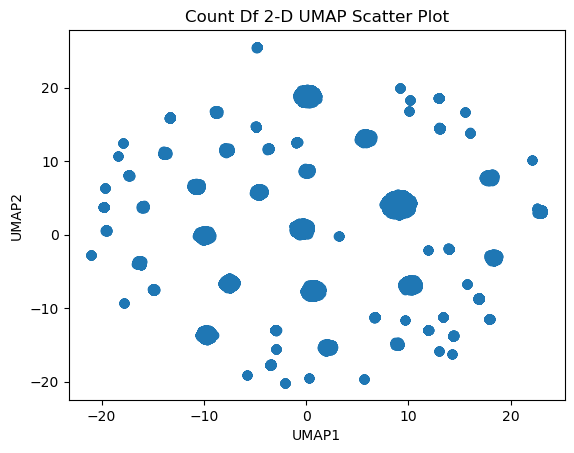

In [38]:
import matplotlib.pyplot as plt

plt.scatter(count_umap_df['UMAP1'], count_umap_df['UMAP2'])
plt.xlabel('UMAP1')
plt.ylabel('UMAP2')
plt.title('Count Df 2-D UMAP Scatter Plot')

Text(0.5, 1.0, 'Tfidf Df 2-D UMAP Scatter Plot')

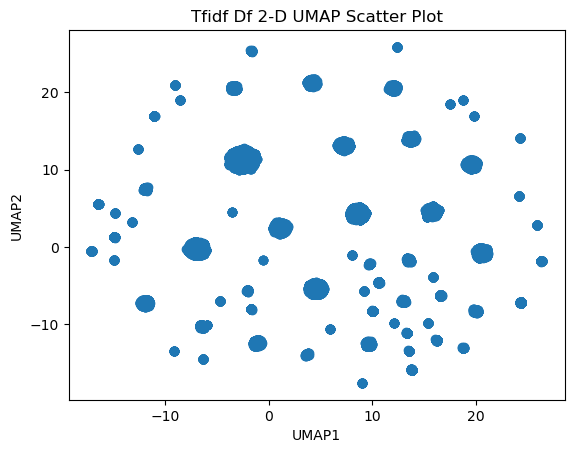

In [39]:
plt.scatter(tfidf_umap_df['UMAP1'], tfidf_umap_df['UMAP2'])
plt.xlabel('UMAP1')
plt.ylabel('UMAP2')
plt.title('Tfidf Df 2-D UMAP Scatter Plot')

### 3-3 Cluster using k-means k=10. Use line separations (like a Voronoi plot) to outline the cluster boundaries
### 3-4 Use marker colors to indicate the real merchant name from the dataset

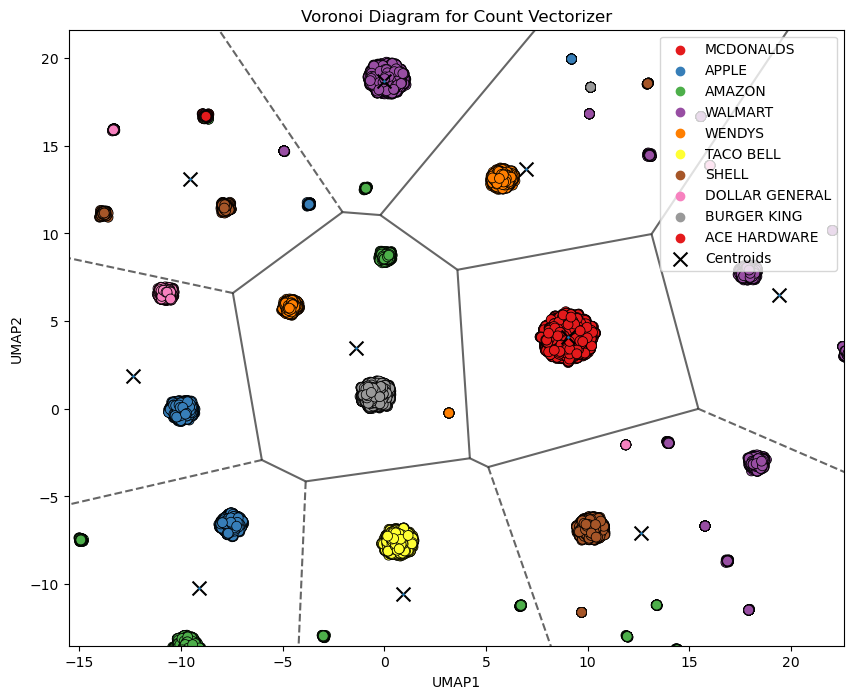

In [43]:
from scipy.spatial import Voronoi, voronoi_plot_2d
from sklearn.cluster import KMeans
import seaborn as sns

def plot_voronoi(umap_df, merchants_data, matrix_type):
    
    kmeans = KMeans(n_clusters=10, random_state=42)
    kmeans.fit(umap_df)

    centroids = kmeans.cluster_centers_

    # Create a Voronoi diagram based on the cluster centers
    vor = Voronoi(centroids)

    # Plot Voronoi regions and boundaries
    fig, ax = plt.subplots(figsize=(10, 8))
    voronoi_plot_2d(vor, ax=ax, show_vertices=False, line_colors='black', line_width=1.5, line_alpha=0.6, point_size=2)

    # Plot data points with seaborn using different color markers for each merchant label
    df = count_umap_df.copy()
    df['merchant'] = merchants_data
    sns.scatterplot(data=df, x='UMAP1', y='UMAP2', hue='merchant', palette='Set1', ax=ax, s=50, edgecolor='k', legend='full')

    # Plot cluster centers with a distinct marker
    ax.scatter(centroids[:, 0], centroids[:, 1], color='black', marker='x', s=100, label='Centroids')

    # Show plot
    plt.title('Voronoi Diagram for ' + matrix_type + ' Vectorizer')
    plt.legend()
    plt.show()

plot_voronoi(count_umap_df, count_df_samp['merchant'], 'Count')

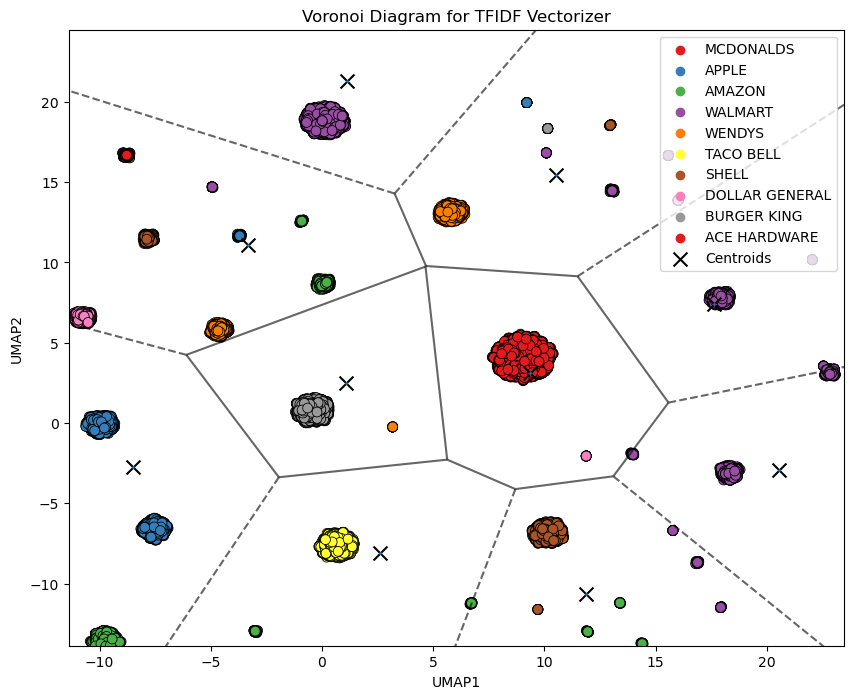

In [44]:
plot_voronoi(tfidf_umap_df, tfidf_df_samp['merchant'], 'TFIDF')